In [46]:
import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.api.types import CategoricalDtype
from scipy.stats import gaussian_kde


In [47]:
# Load the AnnData object from the .h5ad file
adatad = sc.read("DENV2_adatad.h5ad")

In [48]:
adatad.obs["cluster"] = adatad.obs["leiden"].map(
    {
        "0": "quiescent_response",
        "1": "active_response",
    }
)

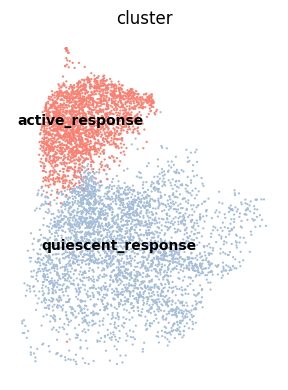

In [49]:
# Custom color map
palette = {'active_response': 'salmon', 'quiescent_response': "#A6BDD7"}

# Plot UMAP with custom palette and retrieve figure
fig = sc.pl.umap(
    adatad, 
    color='cluster',
    palette=palette,
    size=10,
    frameon=False,
    legend_loc='on data',
    show=False
)

# Resize figure
fig = plt.gcf()
fig.set_size_inches(3, 4)

# Optional: adjust layout and save
plt.tight_layout()
plt.savefig("umap_dengue_clusters.pdf", format='pdf', bbox_inches='tight')
plt.show()


#### Run DEG active vs silent infection

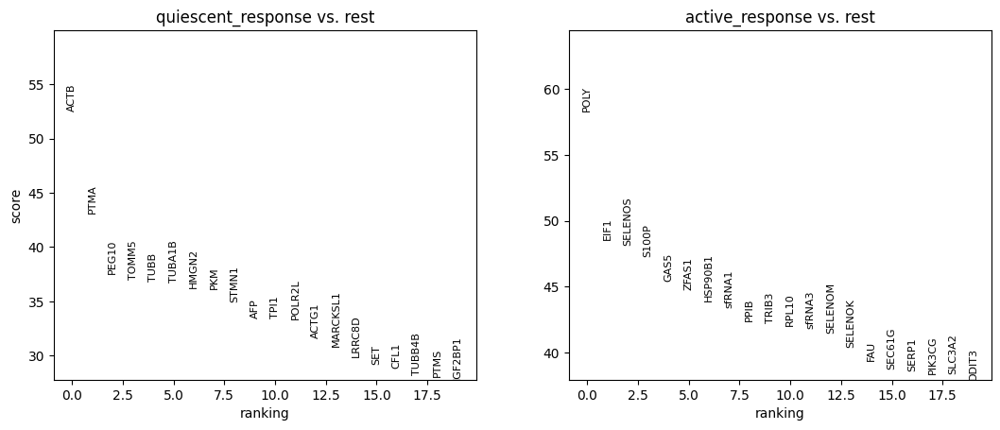

In [50]:
sc.tl.rank_genes_groups(adatad, groupby='cluster', method='wilcoxon')
sc.pl.rank_genes_groups(adatad, n_genes=20, sharey=False)

#top_transition_genes = sc.get.rank_genes_groups_df(adatad, group='high_virus_burden')['names'].head(100).tolist()

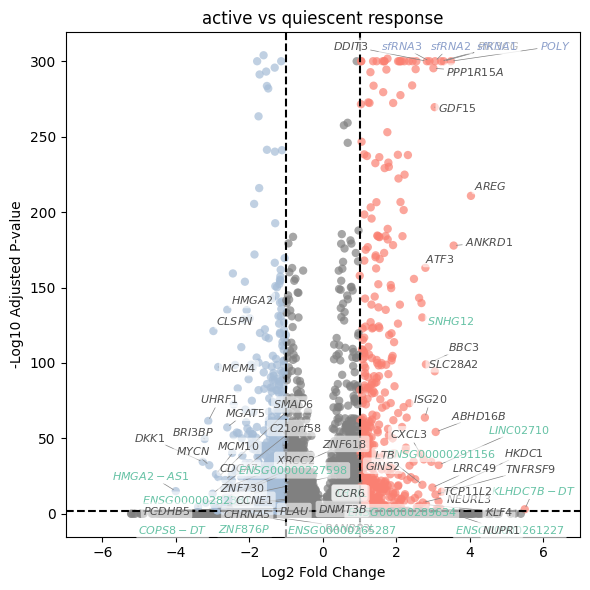

In [51]:
df = sc.get.rank_genes_groups_df(adatad, group='active_response')
df = df.rename(columns={'names': 'gene', 'logfoldchanges': 'log2fc'})

import matplotlib.pyplot as plt
from adjustText import adjust_text
import numpy as np

# --- Replace 0s to avoid -log10(0) errors ---
df['pvals_adj'] = df['pvals_adj'].replace(0, 1e-300)
df['neg_log10_pval'] = -np.log10(df['pvals_adj'])

# --- Define colors for volcano dots ---
fc_thresh = 1.0
pval_thresh = 0.01

def get_color(row):
    if row['pvals_adj'] < pval_thresh and row['log2fc'] > fc_thresh:
        return 'salmon'
    elif row['pvals_adj'] < pval_thresh and row['log2fc'] < -fc_thresh:
        return "#A6BDD7"
    else:
        return 'grey'

df['color'] = df.apply(get_color, axis=1)

# --- Create the volcano plot ---
plt.figure(figsize=(6, 6))
plt.scatter(df['log2fc'], df['neg_log10_pval'], c=df['color'], alpha=0.7, edgecolor='none')

plt.axhline(-np.log10(pval_thresh), color='black', linestyle='--')
plt.axvline(fc_thresh, color='black', linestyle='--')
plt.axvline(-fc_thresh, color='black', linestyle='--')
plt.xlim(-7, 7)
plt.xlabel('Log2 Fold Change')
plt.ylabel('-Log10 Adjusted P-value')
plt.title(f'active vs quiescent response')

# --- Select top genes to label (up/down) ---
top_up = df[(df['pvals_adj'] < pval_thresh) & (df['log2fc'] > fc_thresh)].nlargest(30, 'log2fc')
top_down = df[(df['pvals_adj'] < pval_thresh) & (df['log2fc'] < -fc_thresh)].nsmallest(30, 'log2fc')
top_genes = pd.concat([top_up, top_down])

# --- Extract biotypes from adata ---
biotypes = adatad.var['biotype'].to_dict()  # maps gene -> biotype
biotypes_for_labels = top_genes['gene'].map(biotypes)

# --- Define biotype color map ---
unique_biotypes = biotypes_for_labels.dropna().unique()
biotype_palette = sns.color_palette("Set2", n_colors=len(unique_biotypes))
biotype_color_map = dict(zip(unique_biotypes, biotype_palette))
biotype_color_map['protein_coding'] = '#4D4D4D'  # dark gray override

# --- Repelled labels colored by biotype ---
texts = []
for _, row in top_genes.iterrows():
    gene = row['gene']
    color = biotype_color_map.get(biotypes.get(gene, None), "black")
    texts.append(
        plt.text(
            row['log2fc'], row['neg_log10_pval'], rf"$\it{{{gene}}}$",
            fontsize=8, color=color,
            bbox=dict(boxstyle='round,pad=0.2', fc='white', ec='none', alpha=0.6)
        )
    )

adjust_text(texts, arrowprops=dict(arrowstyle='-', color='gray', lw=0.5))

plt.tight_layout()
plt.savefig("volcano_biotype_labels.pdf", format='pdf', bbox_inches='tight')
plt.show()



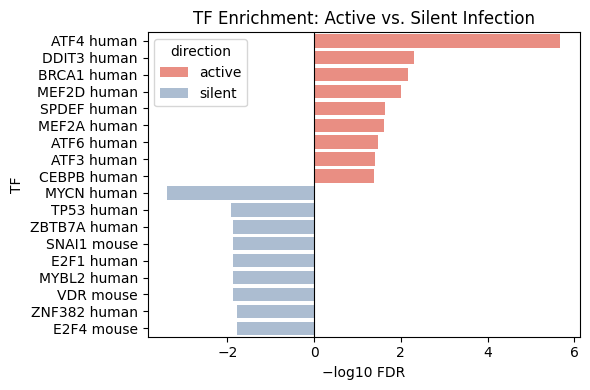

In [52]:
import gseapy as gp

# Proliferative-enriched genes
top_prolif_genes = sc.get.rank_genes_groups_df(adatad, group='active_response')['names'].head(100).tolist()
enr_prolif = gp.enrichr(gene_list=top_prolif_genes,
                        gene_sets='TRRUST_Transcription_Factors_2019',
                        organism='Human')

# Silent-enriched genes
top_silent_genes = sc.get.rank_genes_groups_df(adatad, group='quiescent_response')['names'].head(100).tolist()
enr_silent = gp.enrichr(gene_list=top_silent_genes,
                        gene_sets='TRRUST_Transcription_Factors_2019',
                        organism='Human')




import seaborn as sns

# Format proliferative side (bars go right)
df_prolif = enr_prolif.results.copy()
df_prolif['direction'] = 'active'
df_prolif['bar_height'] = -np.log10(df_prolif['Adjusted P-value'])  # Positive bars

# Format silent side (bars go left)
df_silent = enr_silent.results.copy()
df_silent['direction'] = 'silent'
df_silent['bar_height'] = np.log10(df_silent['Adjusted P-value'])  # Negative bars

# Combine and filter for significance
df_combined = pd.concat([df_prolif, df_silent], ignore_index=True)
df_combined = df_combined[df_combined['Adjusted P-value'] < 0.05]

# Pick top N from each direction
top_n = 9
df_top = pd.concat([
    df_combined[df_combined['direction'] == 'active'].nlargest(top_n, 'bar_height'),
    df_combined[df_combined['direction'] == 'silent'].nsmallest(top_n, 'bar_height')
])

# Sort TFs by bar height so labels are nice
df_top['Term'] = df_top['Term'].str.wrap(25)  # Optional: wrap long names
# Sort: Proliferative first (descending), then Silent (ascending)
df_top['sort_order'] = df_top.apply(
    lambda row: -row['bar_height'] if row['direction'] == 'active' else row['bar_height'], axis=1
)
df_top = df_top.sort_values(by=['direction', 'sort_order'], ascending=[True, True])


# Plot
plt.figure(figsize=(6, 4))
sns.barplot(data=df_top, y='Term', x='bar_height', hue='direction', dodge=False,
            palette={'active': 'salmon', 'silent': "#A6BDD7"})

plt.axvline(0, color='black', linewidth=0.8)
plt.xlabel('−log10 FDR')
plt.ylabel('TF')
plt.title('TF Enrichment: Active vs. Silent Infection')
plt.tight_layout()
plt.savefig("TF_enrichment_labels.pdf", format='pdf', bbox_inches='tight')
plt.show()


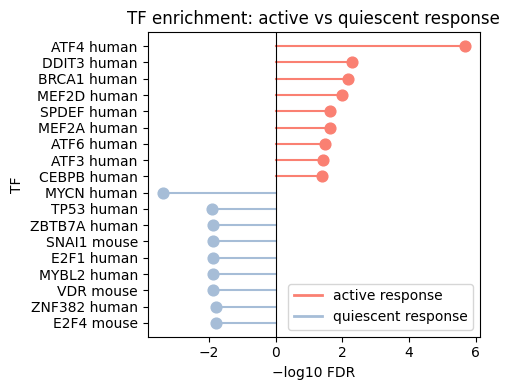

In [53]:
import matplotlib.pyplot as plt

# Set up plot
plt.figure(figsize=(5, 4))

# Assign colors
colors = {'active': 'salmon', 'silent': "#A6BDD7"}

# Get the current sort order index to preserve it
df_top = df_top.reset_index(drop=True)

# Plot lines and circles (lollipops)
for i, row in df_top.iterrows():
    plt.plot([0, row['bar_height']], [i, i], color=colors[row['direction']], lw=1.5)
    plt.scatter(row['bar_height'], i, color=colors[row['direction']], s=60, zorder=3)

# Set y-ticks using the same order as in df_top
plt.yticks(range(len(df_top)), df_top['Term'])
plt.gca().invert_yaxis() 
# Add reference line and labels
plt.axvline(0, color='black', linewidth=0.8)
plt.xlabel('−log10 FDR')
plt.ylabel('TF')
plt.title('TF enrichment: active vs quiescent response')

# Add legend manually
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], color='salmon', lw=2, label='active response'),
    Line2D([0], [0], color="#A6BDD7", lw=2, label='quiescent response')
]
plt.legend(handles=legend_elements, loc='lower right')

plt.tight_layout()
plt.savefig("TF_enrichment_lollipop.pdf", format='pdf', bbox_inches='tight')
plt.show()


#### Plot clusters vs viral load

/tmp/ipykernel_22382/2580253581.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(


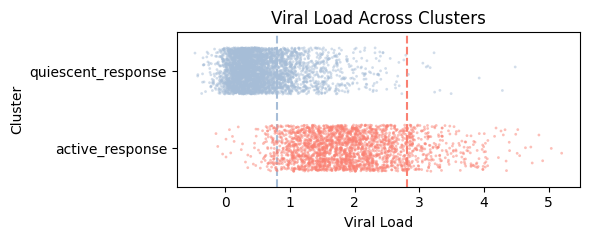

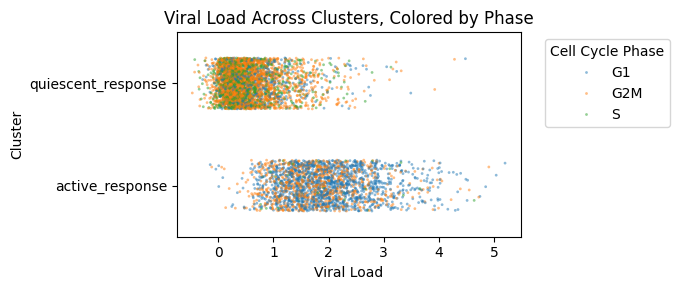

In [54]:
import seaborn as sns
import matplotlib.pyplot as plt
from pandas.api.types import CategoricalDtype

ordered_branches = [
    "quiescent_response",
    "active_response",
]

adatad.obs["cluster"] = adatad.obs["cluster"].astype(
    CategoricalDtype(categories=ordered_branches, ordered=True)
)

palette={'active_response': 'salmon', 'quiescent_response': "#A6BDD7"}

# Plot
plt.figure(figsize=(6, 2.5))
sns.stripplot(
    data=adatad.obs,
    x='viral_load_score',
    y='cluster',
    size=2,
    alpha=0.5,
    #jitter=True,
    jitter=0.3,     # reduce jitter if needed
    palette=palette,
    linewidth=0
)

plt.xlabel("Viral Load")
plt.ylabel("Cluster")
plt.title("Viral Load Across Clusters")
plt.grid(False, axis='x')
# Add vertical split lines
plt.axvline(x=0.8, color="#A6BDD7", linestyle='--', label='silent split')
plt.axvline(x=2.8, color='salmon', linestyle='--', label='active split')
plt.tight_layout()
plt.savefig("clusters_vs_viral_load.pdf", format='pdf', bbox_inches='tight')
plt.show()


# Plot: viral load (x), infection branch (y), color = phase
plt.figure(figsize=(7, 3))
sns.stripplot(
    data=adatad.obs,
    x='viral_load_score',
    y='cluster',
    hue='phase',           # this adds color by phase
    size=2,
    alpha=0.5,
    jitter=0.25,
    linewidth=0
)

plt.xlabel("Viral Load")
plt.ylabel("Cluster")
plt.title("Viral Load Across Clusters, Colored by Phase")
plt.grid(False, axis='x')
plt.legend(title='Cell Cycle Phase', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig("clusters_vs_viral_load_cell_cycle.pdf", format='pdf', bbox_inches='tight')
plt.show()


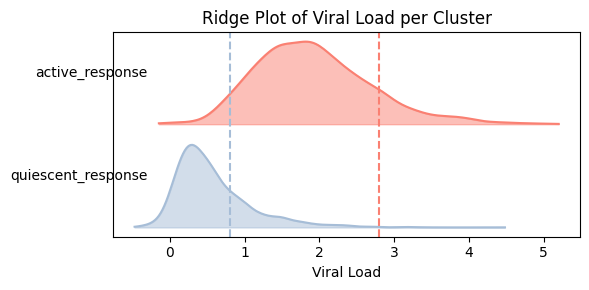

In [55]:
# Define cluster order and colors
ordered_branches = ["quiescent_response", "active_response"]
adatad.obs["cluster"] = adatad.obs["cluster"].astype(
    CategoricalDtype(categories=ordered_branches, ordered=True)
)
palette = {'quiescent_response': "#A6BDD7",'active_response': 'salmon', }

# Set up plot
plt.figure(figsize=(6, 3))
step = 1.0  # vertical space per ridge

for i, cluster in enumerate(adatad.obs["cluster"].cat.categories):
    subset = adatad.obs[adatad.obs["cluster"] == cluster]
    x = subset["viral_load_score"].dropna()

    # KDE
    kde = gaussian_kde(x)
    x_vals = np.linspace(x.min(), x.max(), 200)
    y_vals = kde(x_vals)

    # Normalize and stack
    y_offset = i * step
    y_scaled = y_vals / y_vals.max() * step * 0.8
    plt.fill_between(x_vals, y_offset, y_offset + y_scaled, color=palette[cluster], alpha=0.5)
    plt.plot(x_vals, y_offset + y_scaled, color=palette[cluster], lw=1.5)

    # Label
    plt.text(-0.3, y_offset + step / 2, cluster, ha='right', va='center', fontsize=10)

# Add vertical split lines
plt.axvline(x=0.8, color="#A6BDD7", linestyle='--', label='silent split')
plt.axvline(x=2.8, color='salmon', linestyle='--', label='active split')

# Adjust axes
plt.yticks([])
plt.xlabel("Viral Load")
plt.title("Ridge Plot of Viral Load per Cluster")
plt.tight_layout()
plt.savefig("ridge_clusters_vs_viral_load.pdf", format='pdf', bbox_inches='tight')
plt.show()

#### Now investigate more in-depth

In [56]:
def assign_group(row):
    if row['cluster'] == 'quiescent_response':
        if row['viral_load_score'] <= .8:
            return 'quiescent_lowVL'
        else:
            return 'quiescent_highVL'
    elif row['cluster'] == 'active_response':
        if row['viral_load_score'] <= 2.8:
            return 'active_lowVL'
        else:
            return 'active_highVL'
    return 'other'

adatad.obs['group'] = adatad.obs.apply(assign_group, axis=1)

Running DE: quiescent_highVL vs quiescent_lowVL


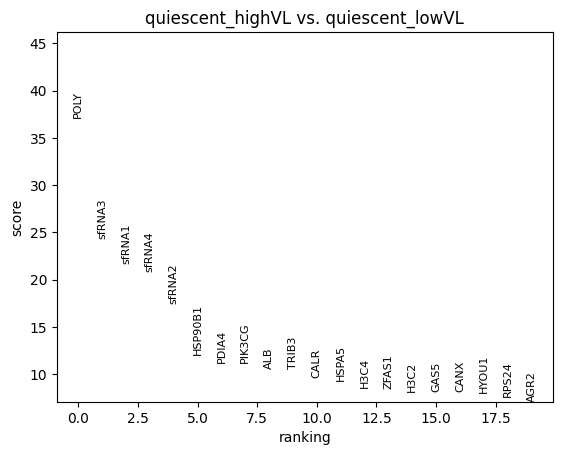

Running DE: active_lowVL vs quiescent_highVL


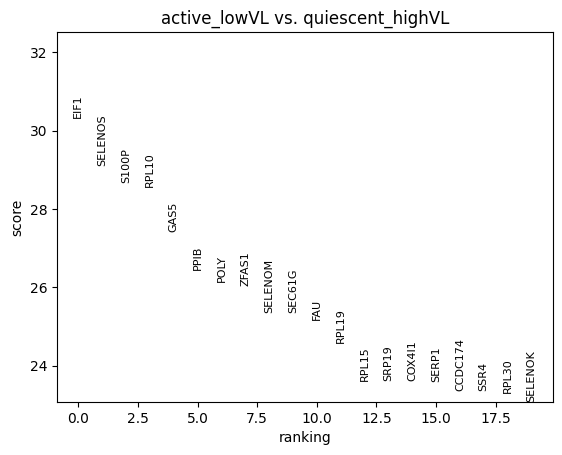

Running DE: quiescent_highVL vs active_lowVL


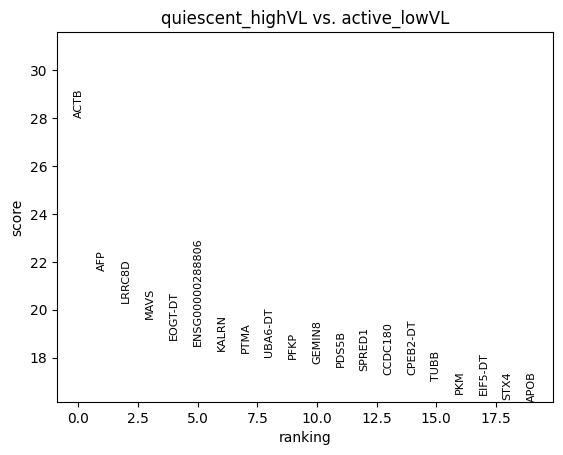

Running DE: active_lowVL vs active_highVL


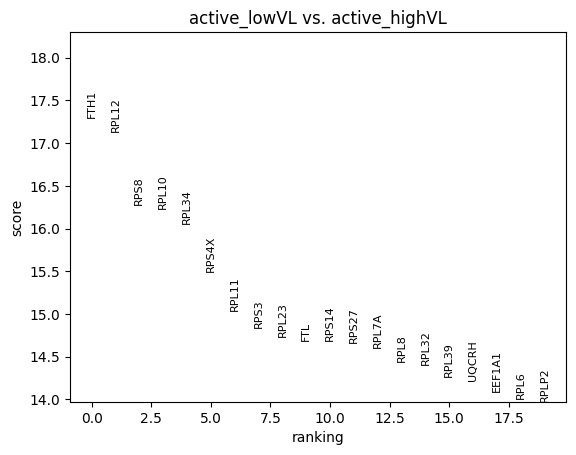

Running DE: quiescent_lowVL vs active_highVL


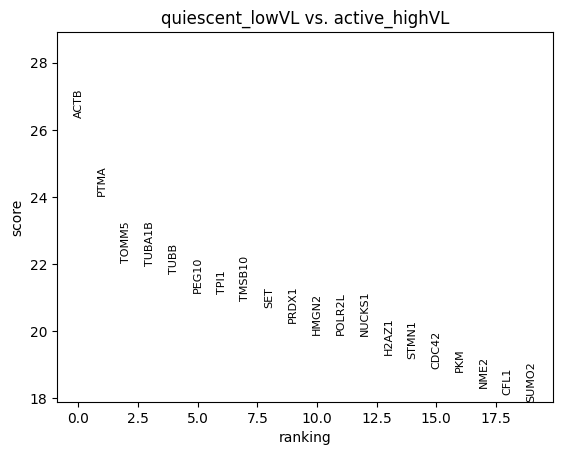

In [57]:
deg_results = {}

comparisons = [
    ("quiescent_highVL", "quiescent_lowVL"),
    ("active_lowVL", "quiescent_highVL"),
    ("quiescent_highVL","active_lowVL"),
    ("active_lowVL", "active_highVL"),
    ("quiescent_lowVL", "active_highVL"),
]

for group, ref in comparisons:
    print(f"Running DE: {group} vs {ref}")
    
    # Run DE
    sc.tl.rank_genes_groups(adatad, groupby='group', groups=[group], reference=ref, method='wilcoxon')
    
    # Get and label DE result
    df = sc.get.rank_genes_groups_df(adatad, group=group)
    df['group'] = group
    df['reference'] = ref

    # Filter by adjusted p-value
    df_filtered = df[df['pvals_adj'] < 0.05]
    
    # Store and save
    deg_results[f"{group}_vs_{ref}"] = df_filtered
    df_filtered.to_csv(f"{group}_vs_{ref}_DEGs.csv", index=False)
    
    # Plot top 20 genes from original DE result (optional)
    sc.pl.rank_genes_groups(adatad, n_genes=20, sharey=False, title=f"DEGs: {group} vs {ref}")


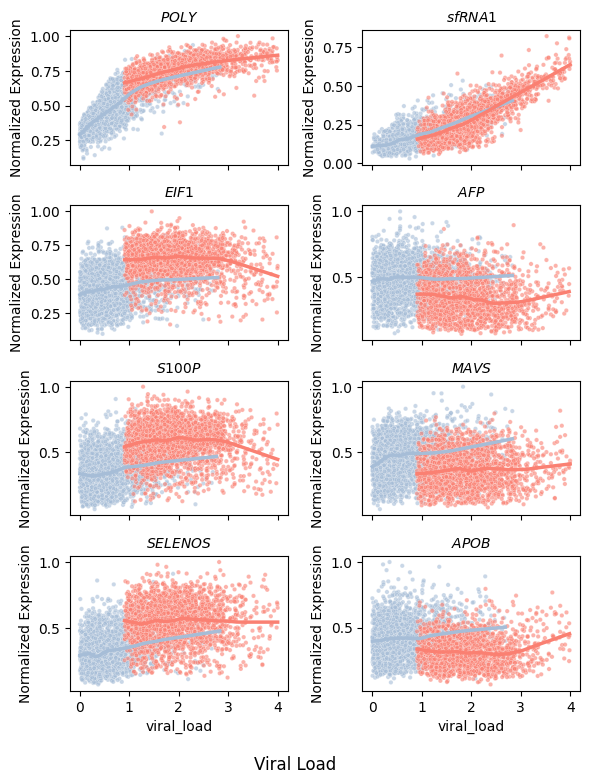

In [58]:
#genes_to_plot = ['POLY',"EIF1",'SELENOS',"S100P", 'ACTB','PTMA', 'SET','MYL6',] # "EIF1",'SELENOS',"S100P", 'TF', 'TUBB', 'AFP', 'APOB', 'BOLA3', 'THRAP3','POLY', 'HSP90B1','PIK3CG','ZNRF3', 'PDIA4','RERE', 'FAU','CALR', 'HSPA5', 'CANX', 'H3C2', 'H3C4', 'ZFAS1',  'GAS5', 'HYOU1',]#
#'AGR2', 'H2AC13', 'MT-ND4','RPS24', 'SERPINA1', 'MANF','ACTB', 'TALAM1']

import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.nonparametric.smoothers_lowess import lowess
import pandas as pd
import numpy as np

genes_to_plot = ['POLY','sfRNA1', "EIF1", 'AFP',"S100P", 'MAVS', 'SELENOS','APOB']
expr = adatad[:, genes_to_plot].to_df()
expr['viral_load'] = adatad.obs['viral_load_score'].values
expr['cluster'] = adatad.obs['cluster'].values

# Normalize gene expression globally
expr_norm = expr.copy()
for gene in genes_to_plot:
    if gene in expr_norm.columns:
        gene_vals = pd.to_numeric(expr_norm[gene], errors='coerce')
        expr_norm[gene] = (gene_vals - gene_vals.min()) / (gene_vals.max() - gene_vals.min())

# Define cluster settings
palette = {'active_response': 'salmon', 'quiescent_response': "#A6BDD7"}
active_clusters = ['active_response']
silent_clusters = ['quiescent_response']
clusters = expr_norm['cluster'].unique()

# Set up subplot grid
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(6, 8), sharex=True)
axes = axes.flatten()

for i, gene in enumerate(genes_to_plot):
    ax = axes[i]
    
    for cluster in clusters:
        # Subset and clip per cluster
        expr_cluster = expr_norm[expr_norm['cluster'] == cluster].copy()
        if cluster in active_clusters:
            expr_cluster = expr_cluster[(expr_cluster['viral_load'] >= 0.9) & (expr_cluster['viral_load'] <= 4)]
        elif cluster in silent_clusters:
            expr_cluster = expr_cluster[(expr_cluster['viral_load'] >= 0.0) & (expr_cluster['viral_load'] <= 3)]
        else:
            continue

        # Drop zero or missing expression
        expr_cluster = expr_cluster[(expr_cluster[gene] > 0) & (~expr_cluster[gene].isna())]

        # Plot scatter
        sns.scatterplot(
            data=expr_cluster,
            x='viral_load',
            y=gene,
            hue='cluster',
            palette=palette,
            s=10,
            alpha=0.6,
            ax=ax,
            legend=False
        )

        # LOWESS
        if len(expr_cluster) >= 10:
            try:
                smoothed = lowess(
                    endog=expr_cluster[gene],
                    exog=expr_cluster['viral_load'],
                    frac=0.3,
                    return_sorted=True
                )
                ax.plot(smoothed[:, 0], smoothed[:, 1], color=palette[cluster], lw=2.5)
            except Exception as e:
                print(f"LOWESS failed for {gene}, {cluster}: {e}")

    ax.set_title(rf"$\it{{{gene}}}$", fontsize=10)
    ax.set_ylabel("Normalized Expression")
    ax.grid(False)

# Cleanup and layout
fig.supxlabel("Viral Load")
#fig.suptitle("Gene Expression vs Viral Load (per gene)", fontsize=14)
plt.tight_layout()
plt.subplots_adjust(top=0.94)
plt.savefig("expression_transition_genes_vs_viral_load.pdf", format='pdf', bbox_inches='tight')
plt.show()


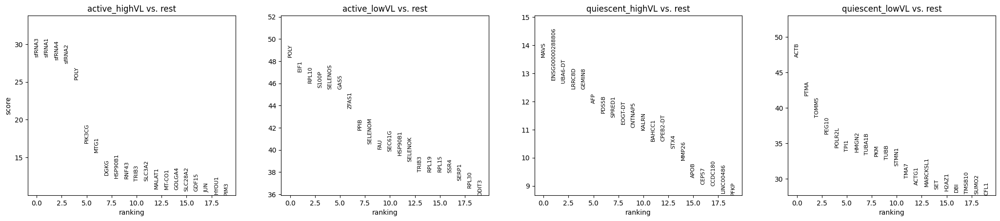

In [59]:
import scanpy as sc

# Run DEGs for all groups in 'group' column vs. the rest
sc.tl.rank_genes_groups(adatad, groupby='group', method='wilcoxon', pts=True)
sc.pl.rank_genes_groups(adatad, n_genes=20, sharey=False)


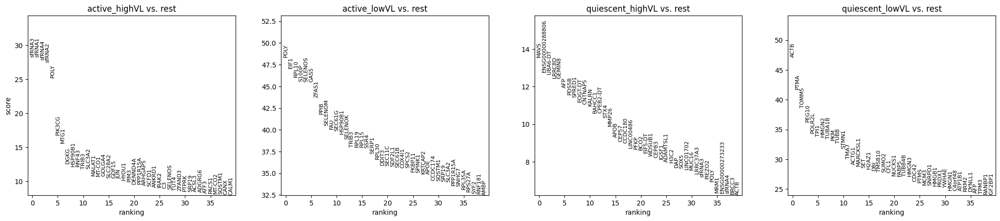

In [60]:
sc.pl.rank_genes_groups(adatad, n_genes=40, sharey=False)

/tmp/ipykernel_22382/639273709.py:87: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


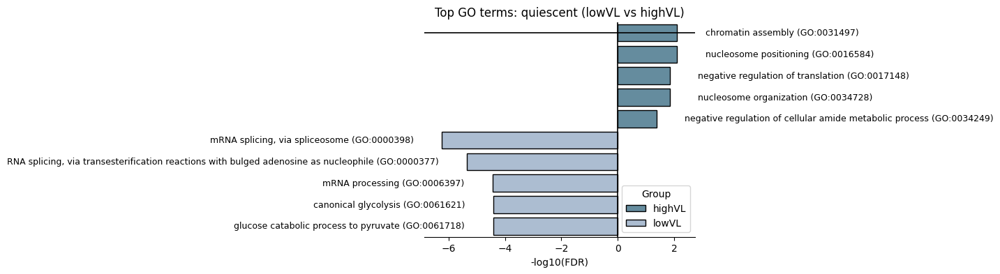

/tmp/ipykernel_22382/639273709.py:87: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


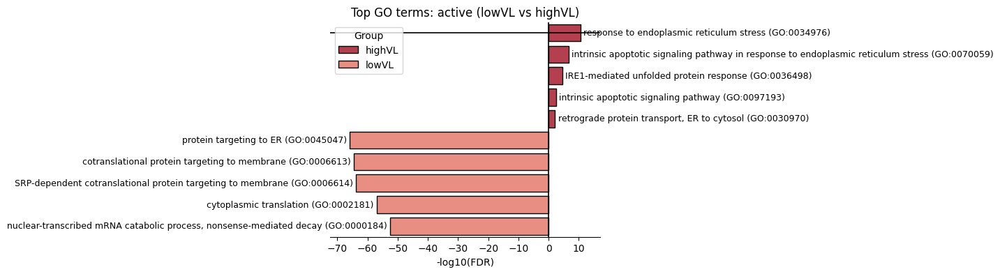

In [61]:
import gseapy as gp

# Get all group labels
groups = adatad.uns['rank_genes_groups']['names'].dtype.names

# Choose gene set: GO Biological Process, Molecular Function, or Cellular Component
go_category = 'GO_Biological_Process_2021'
top_n = 200

go_results = {}

for group in groups:
    # Extract top DEGs for this group
    df = sc.get.rank_genes_groups_df(adatad, group=group)
    
    # Optional: filter by p-value
    df = df[df['pvals_adj'] < 0.05].head(top_n)
    gene_list = df['names'].tolist()
    
    if len(gene_list) < 5:
        print(f"Skipping {group}: too few DEGs")
        continue
    
    # Run Enrichr
    enr = gp.enrichr(
        gene_list=gene_list,
        gene_sets=go_category,
        organism='Human',
        outdir=None,  # don’t write files
        cutoff=0.05
    )
    
    go_results[group] = enr.results
    # Save to CSV if needed
    enr.results.to_csv(f"{group}_GO_enrichment.csv", index=False)

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

def plot_combined_go(go_df, title, color_dict,filename):
    plt.figure(figsize=(5, 4))
    
    ax = sns.barplot(
        data=go_df,
        y='Term',
        x='log10p',
        hue='direction',
        palette=color_dict,
        edgecolor='black'
    )

    # Add x-axis line
    ax.axhline(y=0, color='black', linewidth=1.2)
    ax.axvline(x=0, color='black', linewidth=1.2)

    # Remove borders
    sns.despine(left=True, bottom=False, right=True, top=True)

    # Add GO term labels at ends of bars
    for bar, (_, row) in zip(ax.patches, go_df.iterrows()):        
        xpos = row['log10p']
        align = 'left' if xpos > 0 else 'right'
        offset = 1 if xpos > 0 else -1
        ypos = bar.get_y() + bar.get_height() / 2
        ax.text(xpos + offset, ypos, row['Term'], va='center', ha=align, fontsize=9)


    # Hide default y-tick labels
    ax.set_yticklabels([])
    ax.set_ylabel('')
    ax.tick_params(axis='y', left=False)
    ax.set_xlabel('-log10(FDR)')
    ax.set_title(title)

    # Dynamic x limits
    # Visually balanced space based on actual side widths
    left_width = abs(go_df.loc[go_df['log10p'] < 0, 'log10p'].min()) if any(go_df['log10p'] < 0) else 0
    right_width = go_df.loc[go_df['log10p'] > 0, 'log10p'].max() if any(go_df['log10p'] > 0) else 0

    margin = max(left_width, right_width) * 0.1
    ax.set_xlim(-left_width - margin, right_width + margin)


    ax.legend(title='Group')
    plt.tight_layout()
    plt.savefig(filename, format='pdf', bbox_inches='tight')
    plt.show()

# Prepare and classify data
exclude_terms = ['substantia nigra development (GO:0021762)']
silent_df, active_df = [], []

for group, res in go_results.items():
    filtered = res[~res['Term'].str.lower().isin([t.lower() for t in exclude_terms])]
    top_terms = filtered.sort_values('Adjusted P-value').head(5).copy()
    top_terms['log10p'] = -np.log10(top_terms['Adjusted P-value'].replace(0, 1e-300))
    top_terms['group'] = group

    if 'quiescent' in group:
        top_terms['direction'] = 'highVL' if 'highVL' in group else 'lowVL'
        if 'lowVL' in group:
            top_terms['log10p'] *= -1
        silent_df.append(top_terms)
    elif 'active' in group:
        top_terms['direction'] = 'highVL' if 'highVL' in group else 'lowVL'
        if 'lowVL' in group:
            top_terms['log10p'] *= -1
        active_df.append(top_terms)

# Combine and plot
silent_combined = pd.concat(silent_df)
active_combined = pd.concat(active_df)

plot_combined_go(silent_combined, 'Top GO terms: quiescent (lowVL vs highVL)', {'lowVL': "#A6BDD7", 'highVL': "#5B8FA8"},'silent_go_terms.pdf')
plot_combined_go(active_combined, 'Top GO terms: active (lowVL vs highVL)', {'lowVL': 'salmon', 'highVL':"#C72C41" },'active_go_terms.pdf') #"#9C5528"


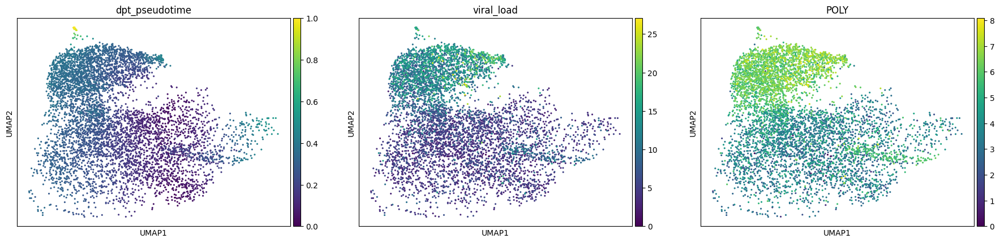

In [62]:
## PSEUDOTIME
# 
sc.pp.neighbors(adatad, n_neighbors=30, n_pcs=30)  # bump neighbors from 15 → 30
sc.tl.diffmap(adatad)

poly_expr = adatad[:, "POLY"].X.toarray().flatten()
adatad.uns['iroot'] = np.argmin(poly_expr)

sc.tl.dpt(adatad)

sc.pl.umap(adatad, color=['dpt_pseudotime', 'viral_load', 'POLY'], cmap='viridis')



In [63]:
adatad.obs['pseudotime_bin'] = pd.qcut(adatad.obs['dpt_pseudotime'], q=20, labels=False)
print(adatad.obs['pseudotime_bin'].value_counts())


pseudotime_bin
19    296
9     296
0     296
11    295
5     295
18    295
10    295
7     295
3     295
2     295
6     295
12    295
15    295
14    295
4     295
8     295
16    295
1     295
13    295
17    295
Name: count, dtype: int64


# Compute PAGA

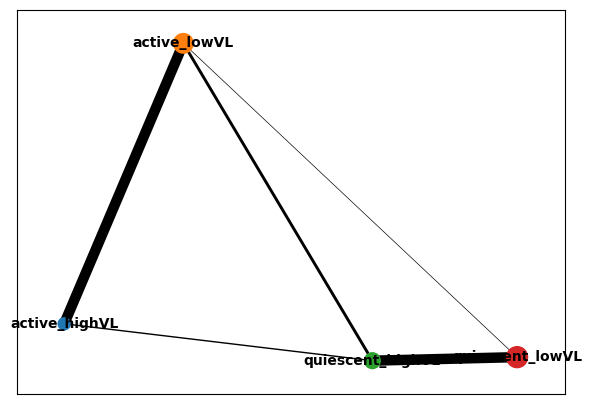

In [67]:
adatad.obs['group'] = adatad.obs['group'].astype('category')
# Step 1: Delete any old .uns keys (optional but helps avoid confusion)
adatad.uns.pop('paga', None)

# Step 3: Compute PAGA using new group key
sc.tl.paga(adatad, groups="group")

# Step 4: Plot PAGA with explicit color
sc.pl.paga(adatad, color="group", threshold=0.03)


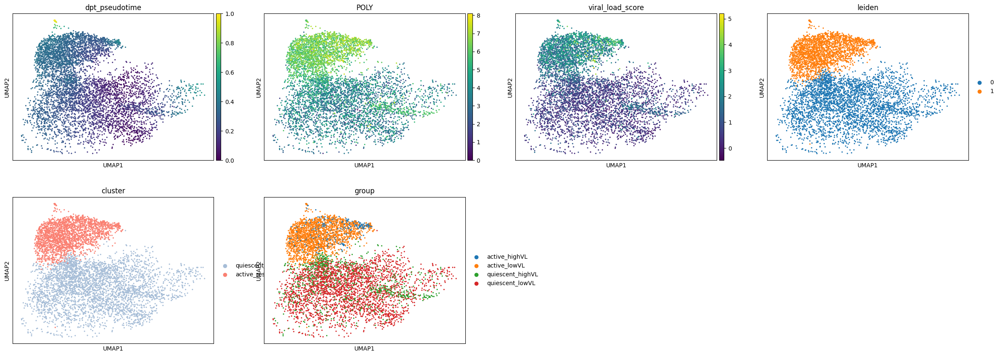

In [68]:

# Visualize again
sc.pl.umap(adatad, color=["dpt_pseudotime", "POLY", "viral_load_score","leiden", "cluster", "group"], cmap='viridis')


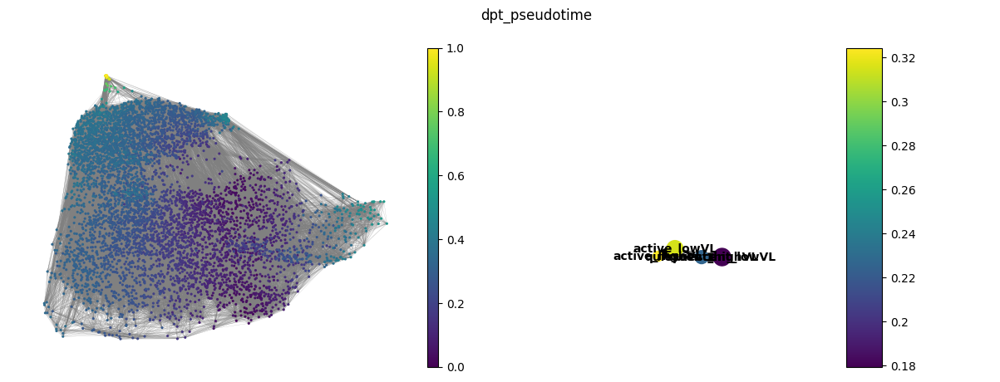

[<Axes: xlabel='UMAP1', ylabel='UMAP2'>, <Axes: >]

In [69]:
sc.pl.paga_compare(adatad, basis='umap', color='dpt_pseudotime', edges=True)


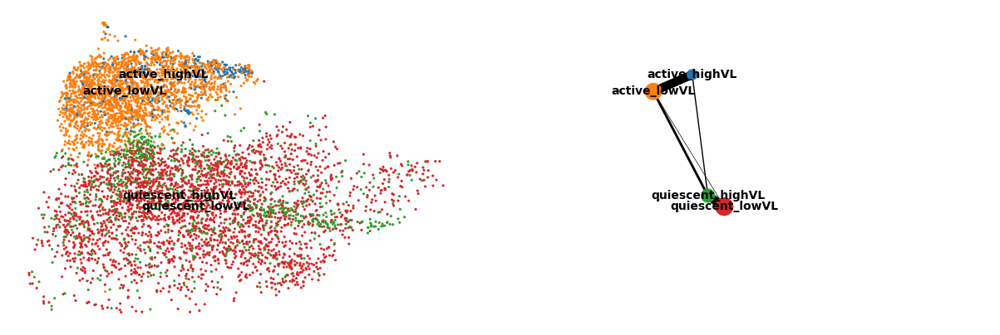

In [70]:
sc.pl.paga_compare(
    adatad,
    basis='umap',              # overlays the PAGA graph on UMAP
    title='',                  # optional
    threshold=0.03,            # optional: filter weak edges
    show=True
)


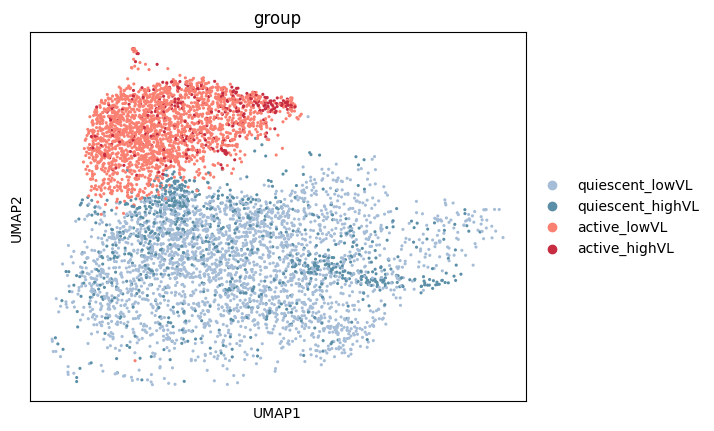

In [71]:
branch_palette = {
    "quiescent_lowVL": "#A6BDD7",  # soft gray-blue
    "quiescent_highVL": "#5B8FA8",             # muted blue
    "active_lowVL": "salmon",         # red "#a9373b",
    "active_highVL": "#C72C41",  # warm brown
    "Silent_infection_remodeling": "#857C74",  # taupe gray
}

# Define the desired order of branches
ordered_branches = [
    "quiescent_lowVL",
    "quiescent_highVL",
    "active_lowVL",
    "active_highVL"
]

# Apply the ordered category
adatad.obs["group"] = adatad.obs["group"].astype(
    CategoricalDtype(categories=ordered_branches, ordered=True)
)

sc.pl.umap(
    adatad, color='group', palette=branch_palette,
    save='UMAP_groups_for_legend.pdf'  
)



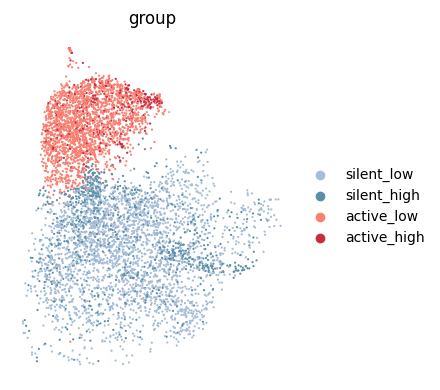

In [26]:
# Custom color map
palette = {'active_infection': 'salmon', 'silent_infection': "#A6BDD7"}

# Plot UMAP with custom palette and retrieve figure
fig = sc.pl.umap(
    adatad, 
    color='group',
    palette=branch_palette,
    size=10,
    frameon=False,
    show=False
)

# Resize figure
fig = plt.gcf()
fig.set_size_inches(4.5, 4)

# Optional: adjust layout and save
plt.tight_layout()
plt.savefig("umap_group_clusters.pdf", format='pdf', bbox_inches='tight')
plt.show()


/tmp/ipykernel_22382/211118153.py:27: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


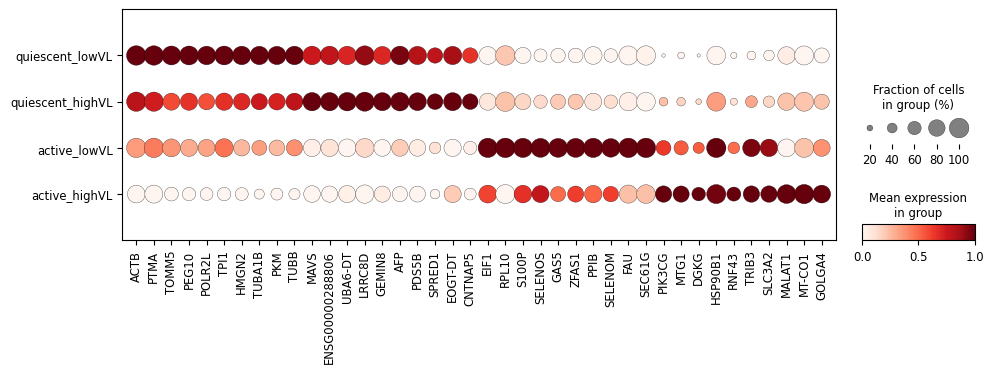

In [72]:
# List of genes you want to exclude
exclude_genes = {'POLY', 'sfRNA1', 'sfRNA2', 'sfRNA3', 'sfRNA4'}

# Extract top N DEGs per group
top_n = 10
grouped_genes = []

for group in adatad.obs['group'].cat.categories:
    df = sc.get.rank_genes_groups_df(adatad, group=group)
    filtered = df[~df['names'].isin(exclude_genes)].head(top_n)
    grouped_genes.extend(filtered['names'].tolist())

# Make sure gene list is unique and in order
genes_to_plot = list(dict.fromkeys(grouped_genes))  # removes duplicates, keeps order

# Now plot only these genes
sc.pl.rank_genes_groups_dotplot(
    adatad,
    groupby='group',
    var_names=genes_to_plot,
    standard_scale='var',
    dendrogram=False,
    figsize=(11, 3),
    show=False
)

plt.tight_layout()
plt.savefig("Dotplot_filtered.pdf", bbox_inches='tight')
plt.show()


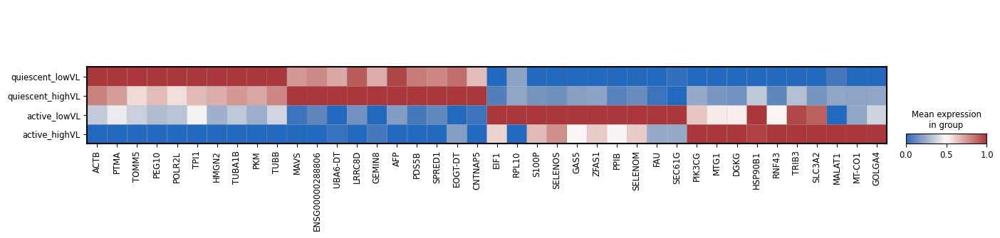

In [73]:
sc.pl.rank_genes_groups_matrixplot(
    adatad,
    var_names=genes_to_plot,   # your filtered custom list
    groupby="group",
    standard_scale='var',      # scales across genes (rows)
    cmap='vlag',
    dendrogram=False,
    save ="heatplot_DEGs_by_group.pdf"     
)


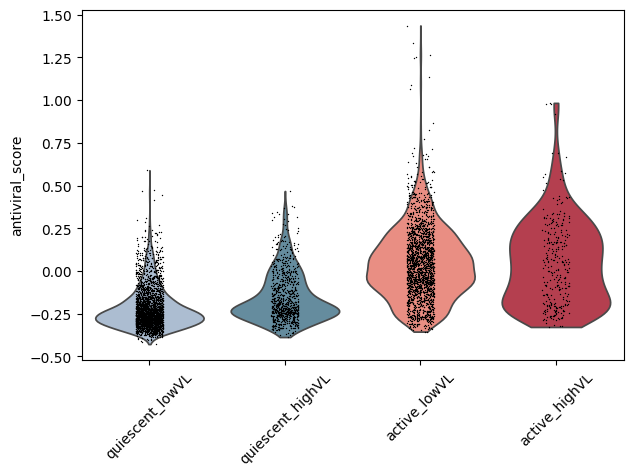

In [74]:
antiviral_genes = ["ISG15", "IFI6", "IFIT1", "MX1", "GADD45A", "DDIT3"]
sc.tl.score_genes(adatad, gene_list=antiviral_genes, score_name="antiviral_score")
sc.pl.violin(adatad, 
   keys="antiviral_score", 
   groupby="group",
   rotation=45)


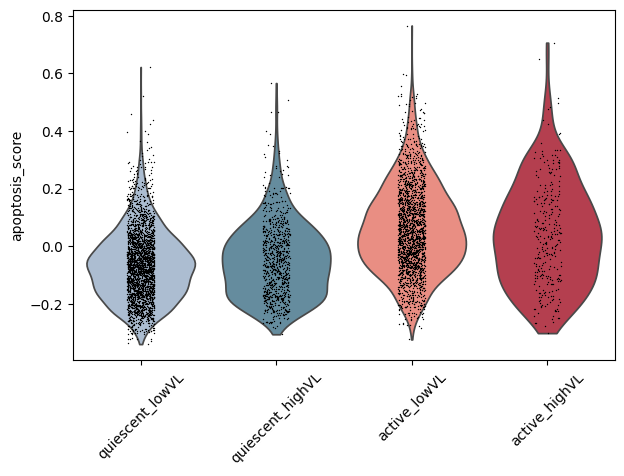

In [75]:
apoptosis_genes = [
    "BAX", "BAK1", "CASP3", "CASP8", "CASP9", 
    "BBC3", "PMAIP1", "TP53", "GADD45A", "FAS"
]

# Compute apoptosis score
sc.tl.score_genes(adatad, gene_list=apoptosis_genes, score_name="apoptosis_score")
sc.pl.violin(adatad, 
   keys="apoptosis_score", 
   groupby="group",
   rotation=45)

/tmp/ipykernel_22382/112930438.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_22382/112930438.py:30: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(
/tmp/ipykernel_22382/112930438.py:30: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(
/tmp/ipykernel_22382/112930438.py:30: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 0}` instead.

  sns.pointplot(


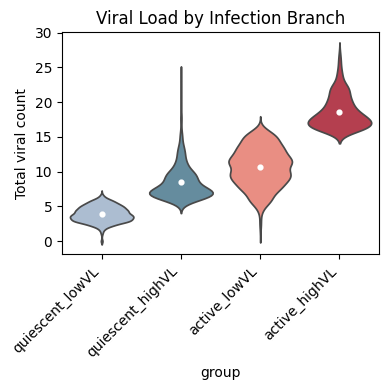

In [76]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from pandas.api.types import CategoricalDtype

# Create dataframe for plotting
df = pd.DataFrame({
    "viral_load": adatad.obs["viral_load"],
    "group": adatad.obs["group"]
})


# Ensure ordered category
df["group"] = df["group"].astype(
    CategoricalDtype(categories=ordered_branches, ordered=True)
)

# Plot violin
plt.figure(figsize=(4, 4))
ax = sns.violinplot(
    data=df,
    x="group",
    y="viral_load",
    order=ordered_branches,
    palette=branch_palette,
    inner=None
)

# Overlay mean dots
sns.pointplot(
    data=df,
    x="group",
    y="viral_load",
    order=ordered_branches,
    color='white',
    join=False,
    markers='o',
    scale=0.6,
    errwidth=0
)

plt.xticks(rotation=45, ha='right')
plt.ylabel("Total viral count")
plt.title("Viral Load by Infection Branch")
plt.tight_layout()
#plt.savefig("Violin_branches_with_mean.pdf")
plt.show()


#### Explore various pathways

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


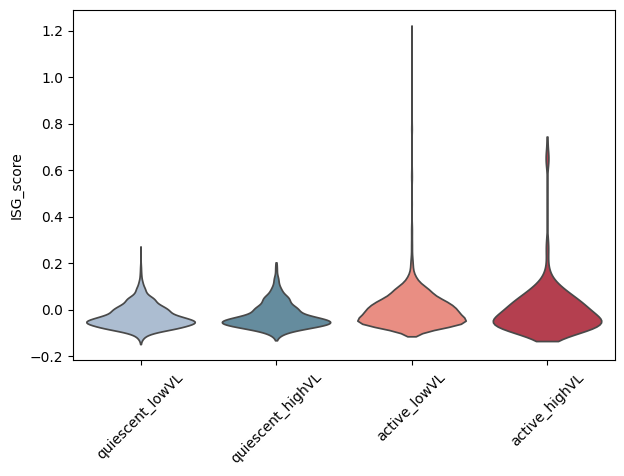

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


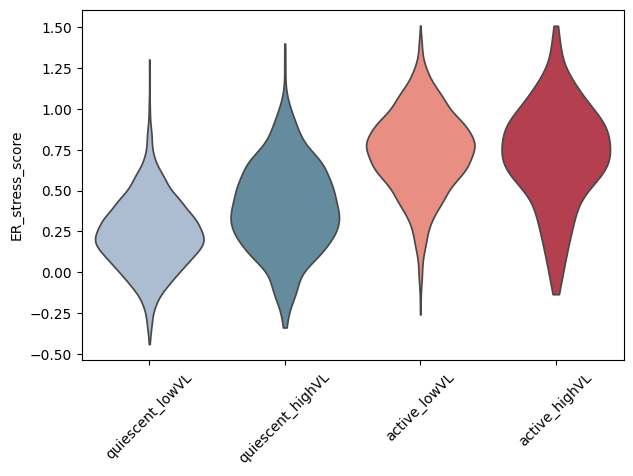

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


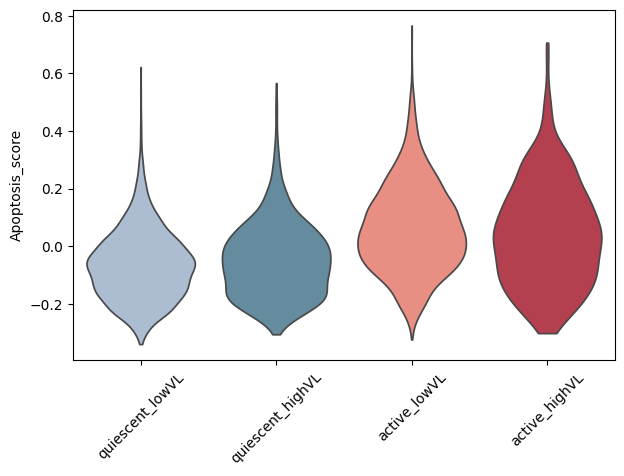

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


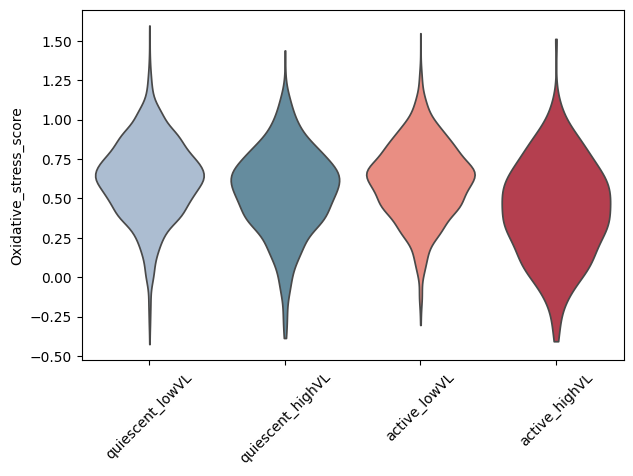

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


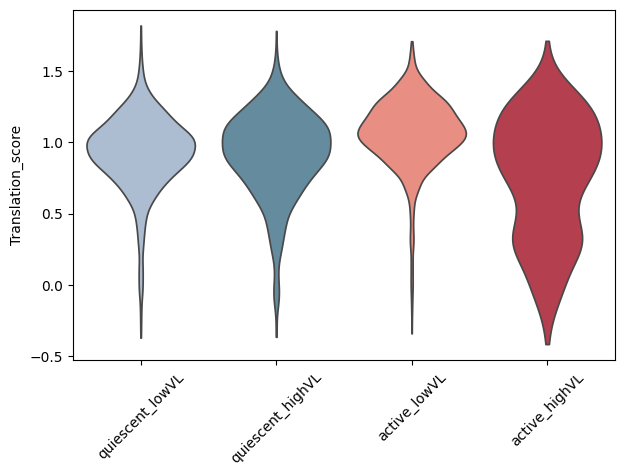

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


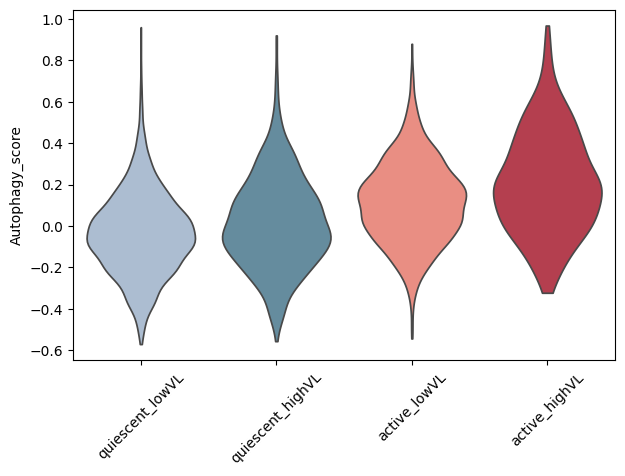

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


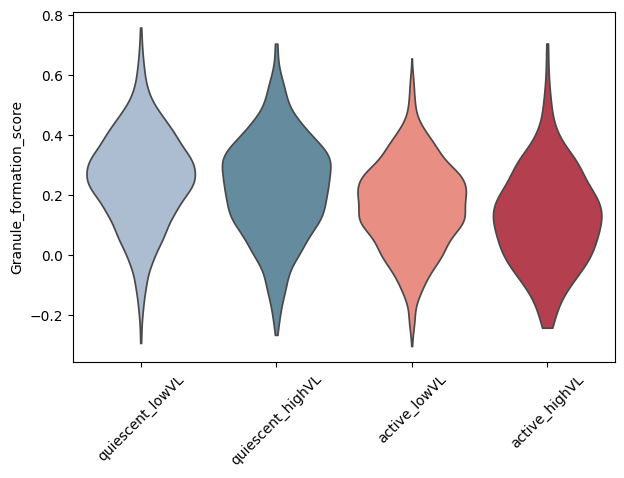

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


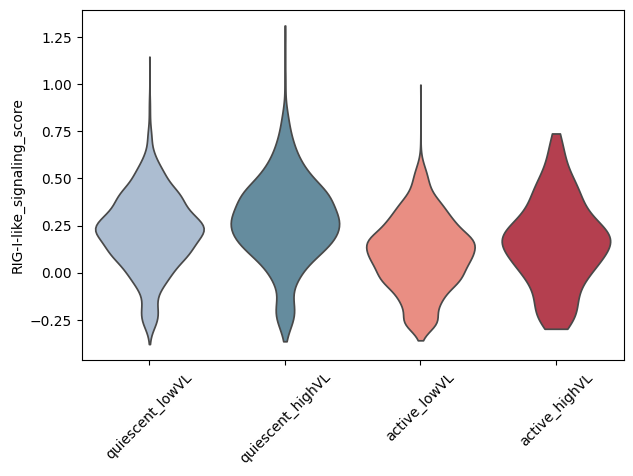

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


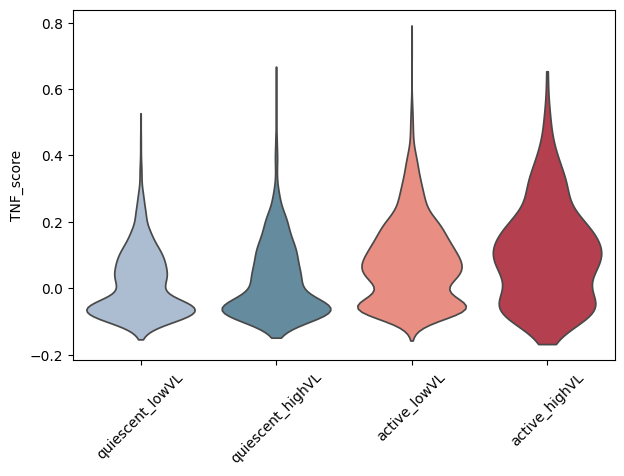

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


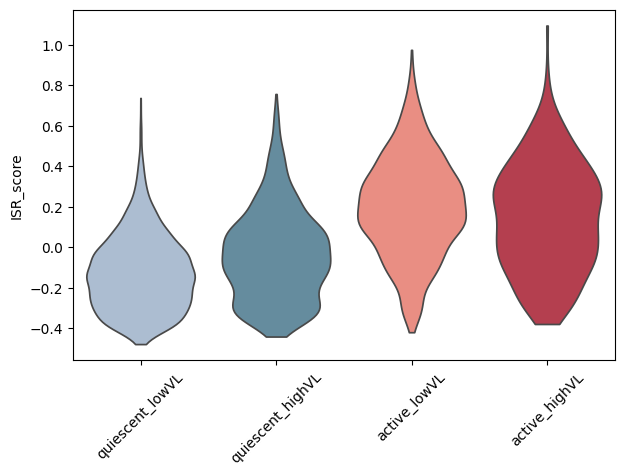

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


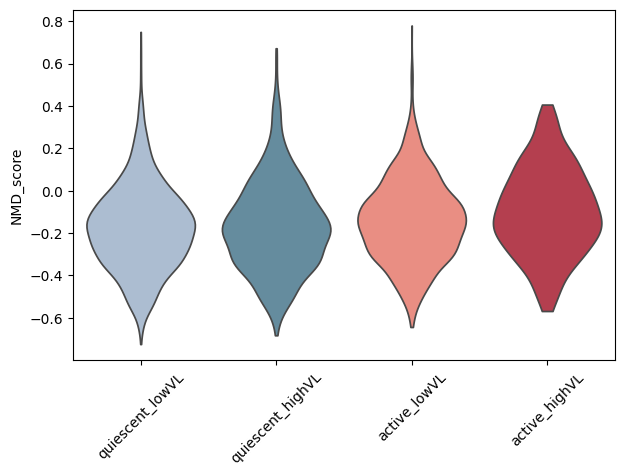

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


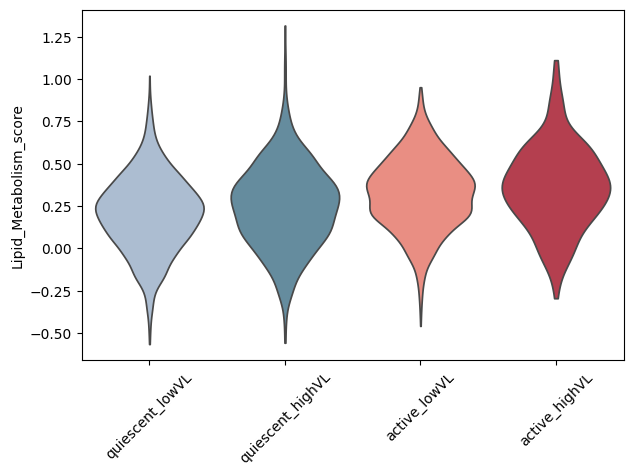

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


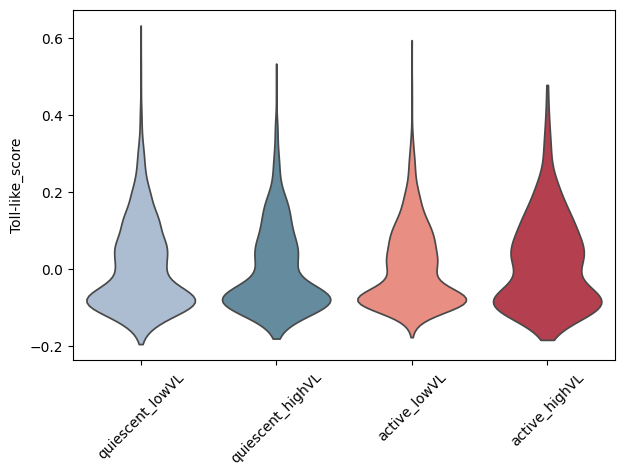

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


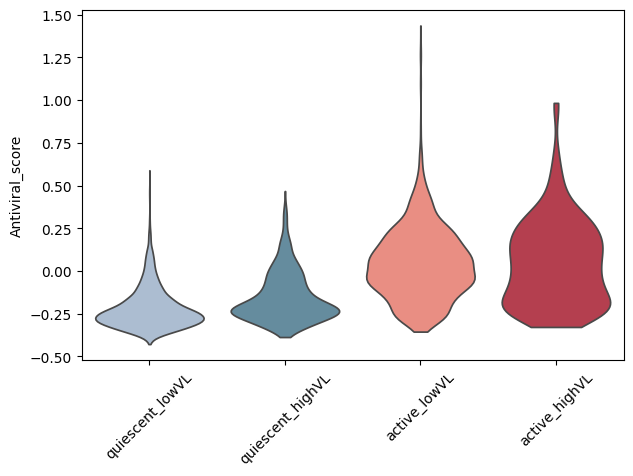

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


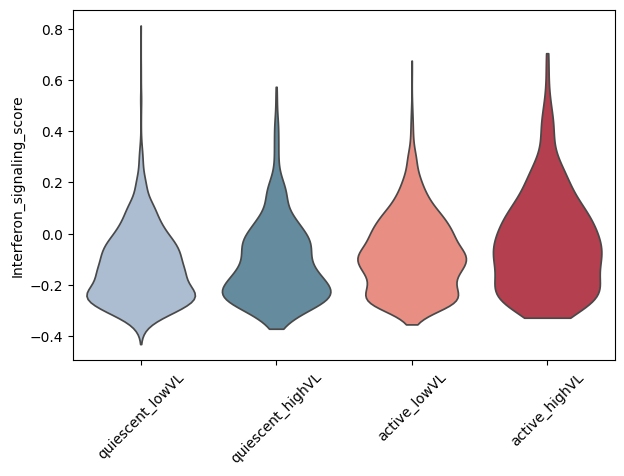

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


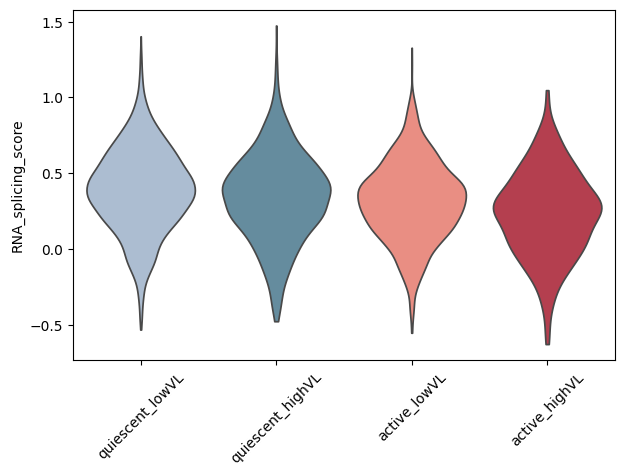

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


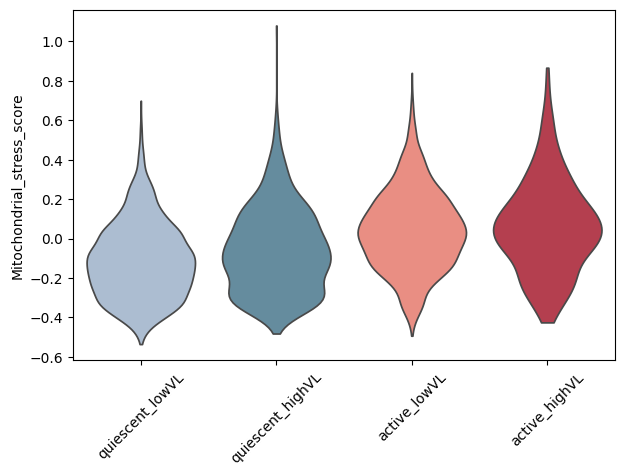

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


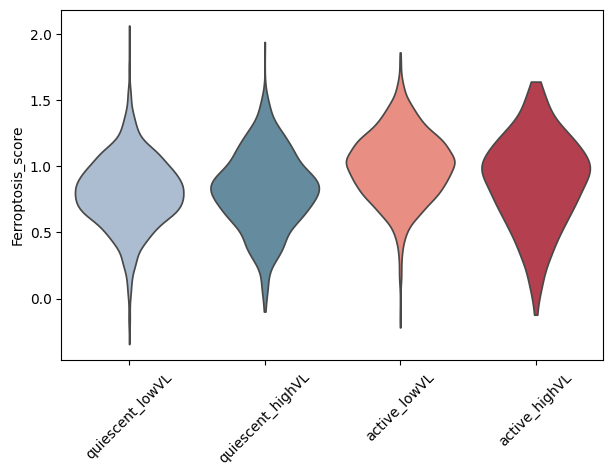

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


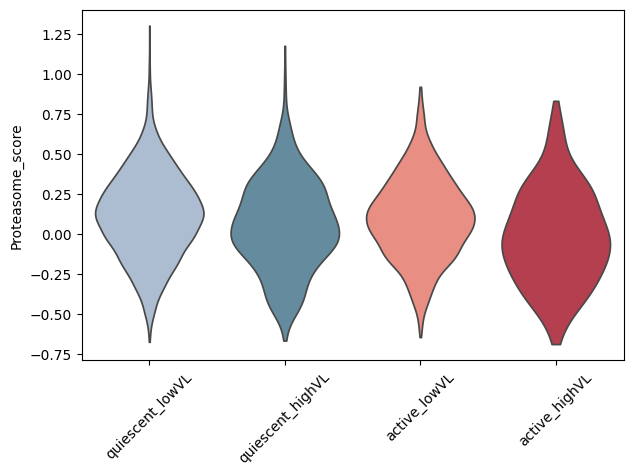

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


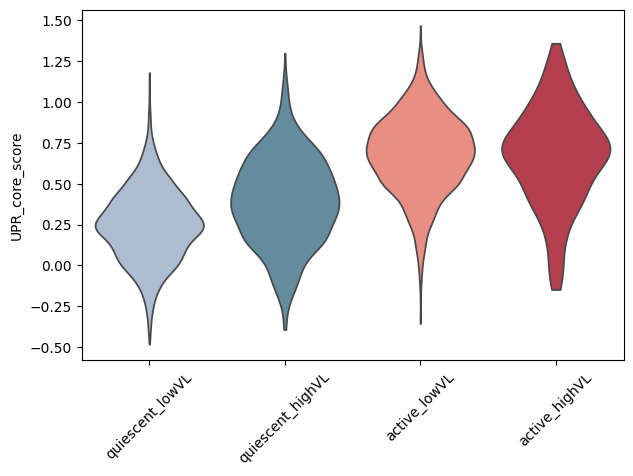

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


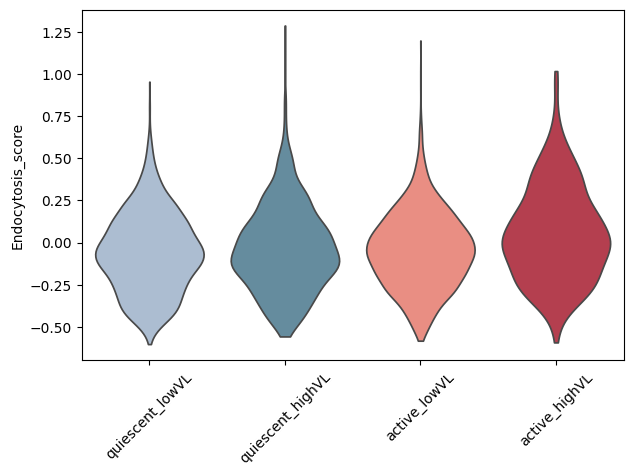

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


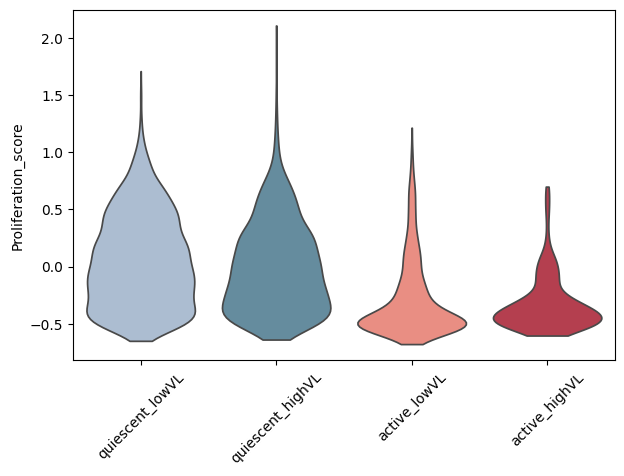

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


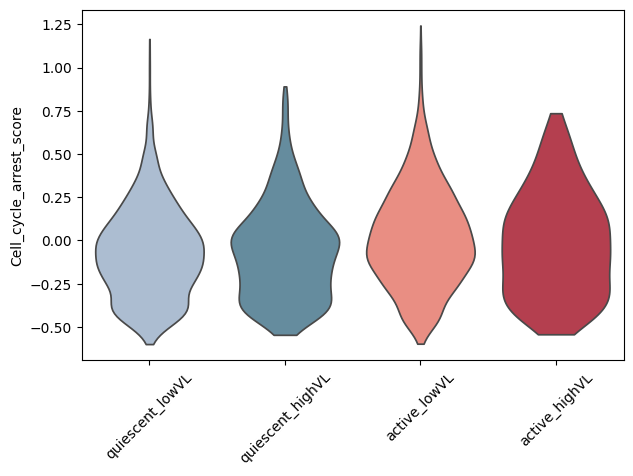

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


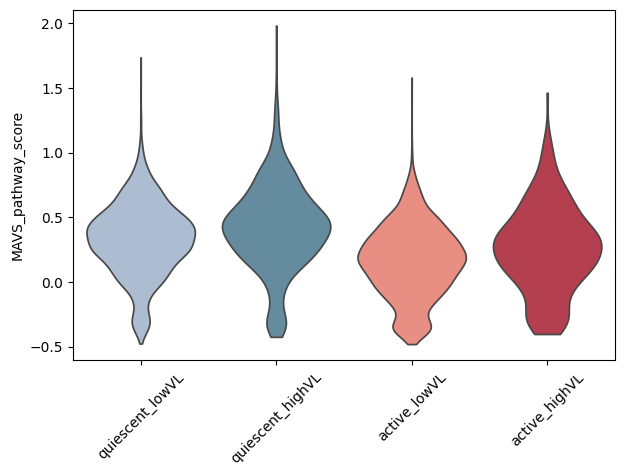

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


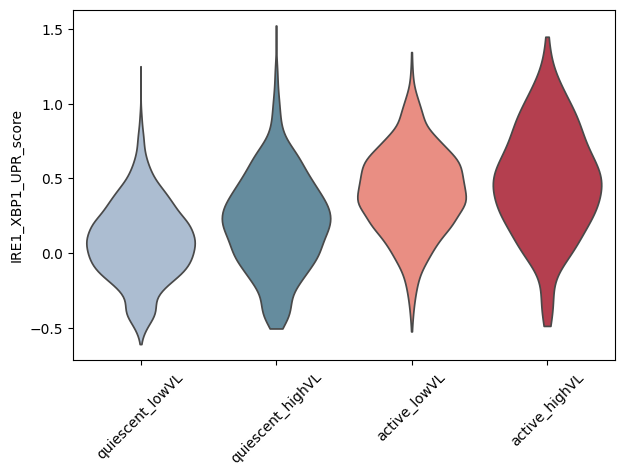

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


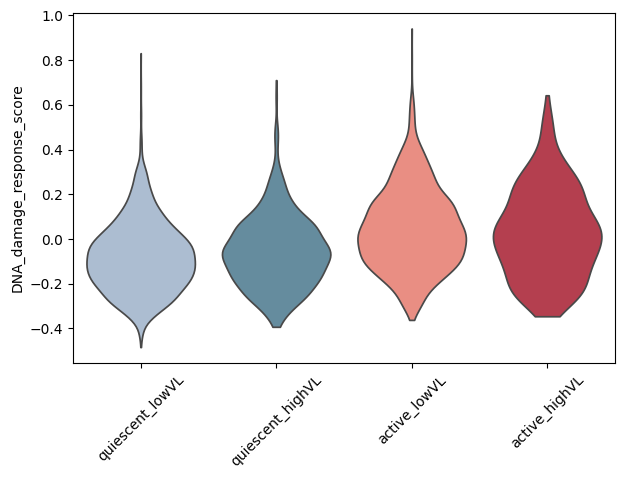

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


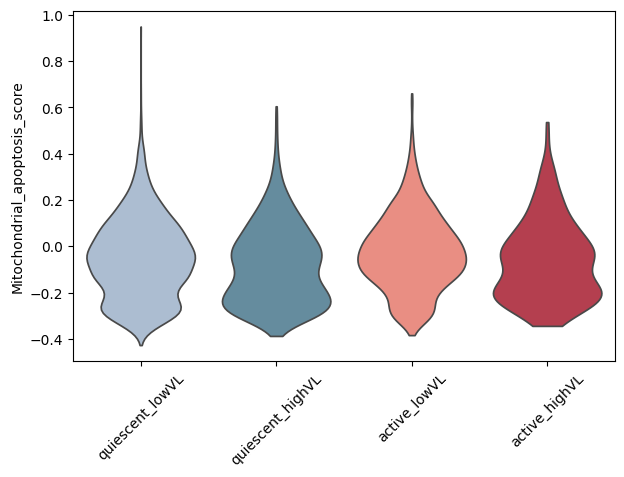

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


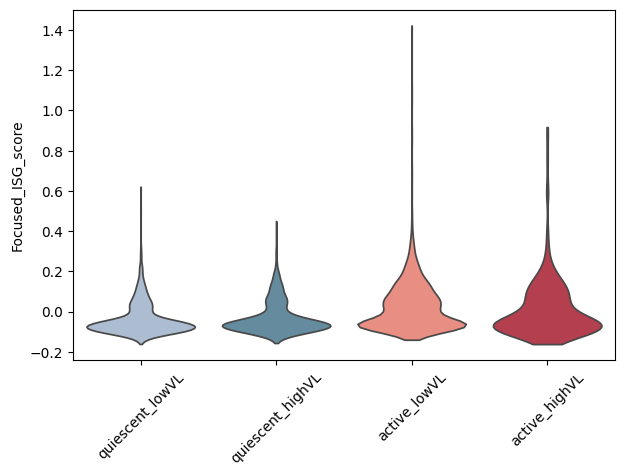

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


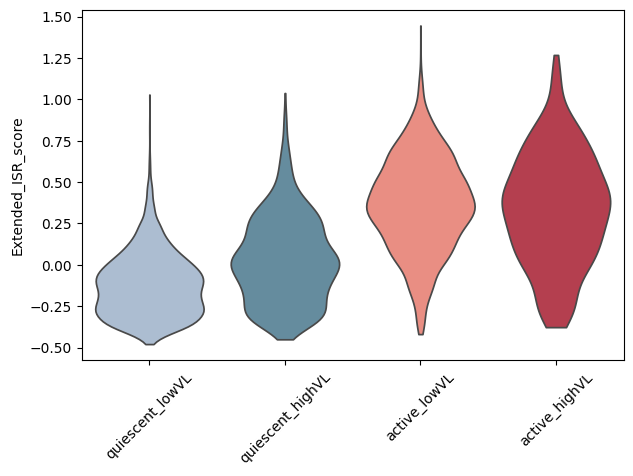

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


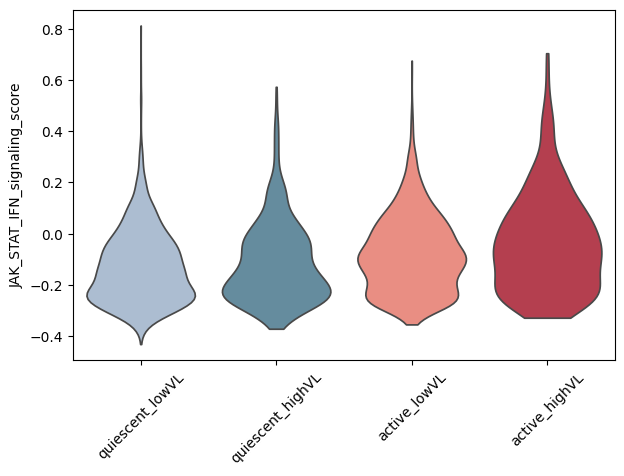

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


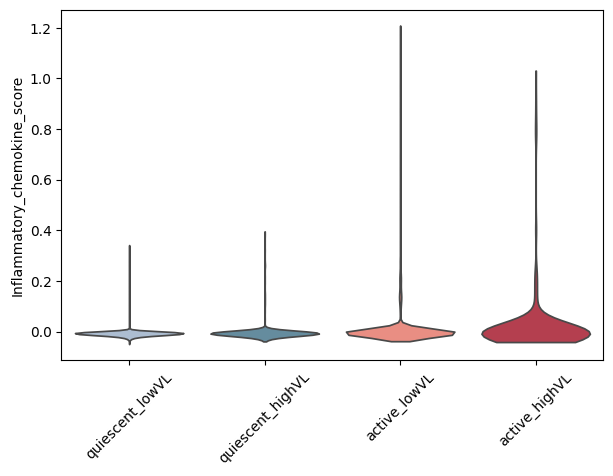

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


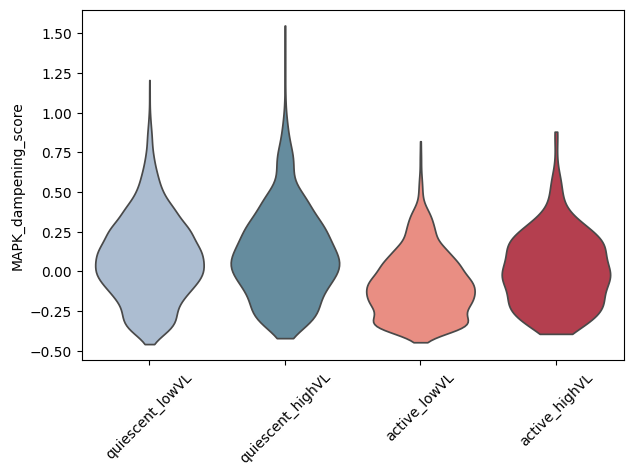

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


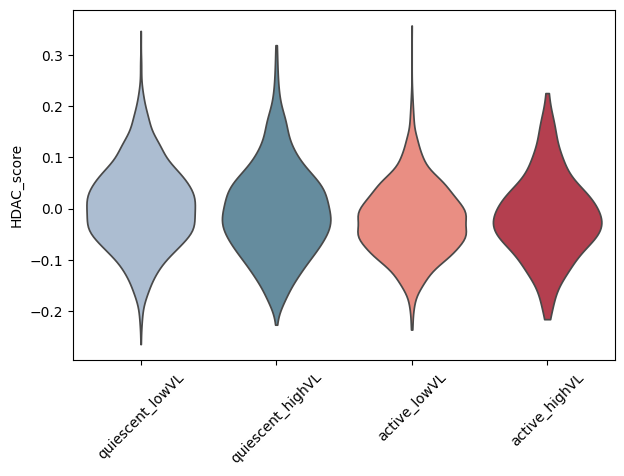

/home/users/isakova/.local/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


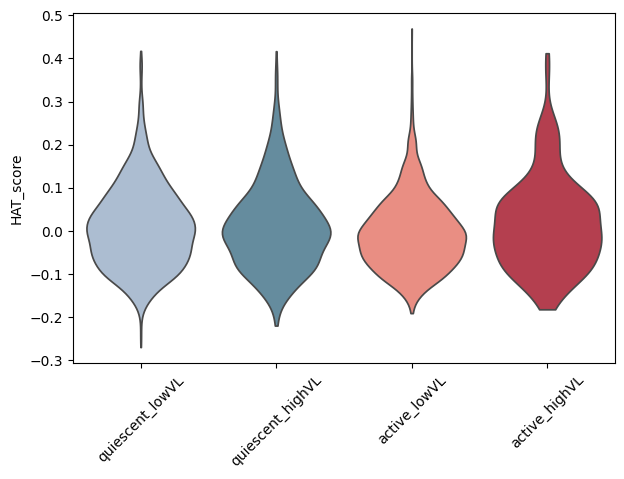

In [77]:
plt.rcParams['figure.figsize'] = plt.rcParamsDefault['figure.figsize']
import scanpy as sc
from pandas.api.types import CategoricalDtype

# Optional: ensure the infection_branch order is preserved

adatad.obs["group"] = adatad.obs["group"].astype(
    CategoricalDtype(categories=ordered_branches, ordered=True)
)

# ----------------------------
# Define gene sets
# ----------------------------
granule_genes = [
    "G3BP1",  # master SG nucleator
    "G3BP2",
    "TIA1", "TIAL1",  # RNA-binding and SG formation
    "ELAVL1",  # binds AREs, modulates SG/PB
    "DDX3X",  # RNA helicase, SG component
    "FMR1",   # SG localization
    "CSDE1",  # SG formation during stress
    "EIF4G1", "EIF3A",  # translation initiation factors that relocalize to SGs
    "DCP1A", "DCP2",  # core P-body decapping enzymes
    "LSM1", "LSM14A",  # P-body proteins
    "EDC3", "XRN1",  # P-body associated decay factors
    "HNRNPA1", "HNRNPA2B1"  # shuttle proteins between nucleus, cytoplasm, granules
]
isg_genes = [
    "ISG15", "IFIT1", "IFIT2", "IFIT3", "MX1", "MX2", "OAS1", "OAS2", "OAS3", 
    "IFI6", "IFI27", "IRF7", "RSAD2", "IFITM1", "IFITM2", "IFITM3", "BST2"
]

er_stress_genes = [
    "DDIT3", "ATF4", "XBP1", "HSPA5", "EDEM1", "HERPUD1", "HSP90B1", "ATF6", "ERN1"
]

apoptosis_genes = [
    "BAX", "BAK1", "CASP3", "CASP8", "CASP9", "BBC3", "PMAIP1", "TP53", "GADD45A", "FAS"
]

oxidative_stress_genes = [
    "NFE2L2", "HMOX1", "SOD2", "GCLC", "GCLM", "TXN", "PRDX1", "NQO1"
]

translation_genes = [
    "EIF2AK2", "EIF4EBP1", "EIF4E", "EIF3A", "RPS6", "RPL13", "RPLP0", "EIF2S1"
]

autophagy_genes = [
    "BECN1", "MAP1LC3B", "ATG5", "ATG7", "SQSTM1", "RAB7A", "GABARAPL1", "UVRAG"
]

rigi_pathway = ["DDX58", "IFIH1", "MAVS", "IRF3", "IRF7", "TRAF3", "TBK1"]

tnf_pathway = ["TNF", "NFKBIA", "NFKB1", "NFKB2", "RELA", "CXCL10", "CCL2", "IL6", "IL8"]

isr_genes = ["EIF2AK2", "EIF2S1", "ATF4", "DDIT3", "GADD34", "PPP1R15A", "CHAC1"]

nmd_genes = ["UPF1", "UPF2", "SMG1", "SMG6", "SMG7", "EIF4A3", "RBM8A", "MAGOH"]
lipid_autophagy = ["SQSTM1", "MAP1LC3B", "BECN1", "ATG5", "ATG7", "PLIN2", "SCD", "FASN"]
tlr_genes = ["TLR3", "TLR7", "MYD88", "TRAF6", "IRAK1", "NFKB1", "RELA"]
antiviral_genes = ["ISG15", "IFI6", "IFIT1", "MX1", "GADD45A", "DDIT3"]

hdac_genes = [
    "HDAC1", "HDAC2", "HDAC3", "HDAC4", "HDAC5", "HDAC6", "HDAC7", "HDAC8", "HDAC9", "HDAC10", "HDAC11",
    "SIRT1", "SIRT2", "SIRT3", "SIRT4", "SIRT5", "SIRT6", "SIRT7",
    "SIN3A", "SIN3B", "NCoR1", "NCOR2", "RBBP4", "RBBP7", "CHD4", "MTA1", "MTA2", "YY1", "REST", "ZNF217"
]

hat_genes = [
    "KAT2A", "KAT2B", "KAT3A", "KAT3B", "KAT5", "KAT6A", "KAT6B", "KAT7", "KAT8",
    "TRRAP", "EP400", "BRPF1", "YEATS2", "ING1", "ING2", "ING3", "ING4", "ING5"
]

# Additional categories
interferon_signaling_genes = ["STAT1", "STAT2", "IRF9", "JAK1", "TYK2", "IFNAR1", "IFNAR2"]

rna_splicing_genes = ["SRSF1", "SRSF3", "HNRNPH1", "HNRNPA1", "SF3B1", "U2AF2"]

mitochondrial_stress_genes = ["ATF5", "HSPA9", "LONP1", "CLPP", "DDIT4", "DNAJA3"]

ferroptosis_genes = ["GPX4", "ACSL4", "SLC7A11", "SLC3A2", "FTH1", "NFE2L2"]

proteasome_genes = ["PSMA1", "PSMB5", "PSMC3", "PSMD1", "UBE2D2", "RNF5"]

upr_core_genes = ["HSPA5", "DDIT3", "XBP1", "ATF4", "ATF6", "ERN1", "EIF2AK3", "HSP90B1"]

endocytosis_genes = ["CLTC", "DNM2", "RAB5A", "RAB7A", "VAMP3", "SNAP23"]

proliferation_genes = ["MKI67", "TOP2A", "PCNA", "CDK1", "CCNB1"]

cell_cycle_arrest_genes = ["CDKN1A", "CDKN2A", "GADD45A", "TP53"]

mavs_pathway_genes = ["MAVS",  "TBK1", "TRAF3","TRAF6"]
#mavs_pathway_genes = ["MAVS", "IRF3", "IRF7", "TBK1", "TRAF3", "DDX58", "IFIH1"]

ire1_xbp1_upr_genes = ["XBP1", "ERN1", "HSPA5", "DNAJC3", "EDEM1"]

dna_damage_response_genes = ["TP53", "CDKN1A", "GADD45A", "BBC3", "BAX", "PMAIP1", "ATM", "CHEK2"]

mitochondrial_apoptosis_genes = ["CASP3", "CASP9", "BAX", "BAK1", "CYCS", "APAF1"]

focused_isg_genes = ["ISG15", "IFITM1", "IFITM2", "IFITM3", "OAS1", "MX1", "RSAD2", "BST2"]

extended_isr_genes = ["ATF4", "DDIT3", "PPP1R15A", "GADD34", "ASNS", "CHAC1", "TRIB3"]

jak_stat_genes = ["IFNAR1", "IFNAR2", "JAK1", "TYK2", "STAT1", "STAT2", "IRF9"]

proinflammatory_chemokine_genes = ["CXCL10", "CCL5", "CCL2", "IL6", "IL8", "TNF"]

mapk_dampening_genes = ["SPRED1", "SPRED2", "DUSP4", "DUSP6", "NF1", "RASA1"]

# ----------------------------
# Compute gene scores
# ----------------------------

gene_sets = {
    "ISG_score": isg_genes,
    "ER_stress_score": er_stress_genes,
    "Apoptosis_score": apoptosis_genes,
    "Oxidative_stress_score": oxidative_stress_genes,
    "Translation_score": translation_genes,
    "Autophagy_score": autophagy_genes,
    "Granule_formation_score": granule_genes,
    "RIG-I-like_signaling_score": rigi_pathway,
    "TNF_score": tnf_pathway,
    "ISR_score": isr_genes,
    "NMD_score": nmd_genes,
    "Lipid_Metabolism_score": lipid_autophagy,
    "Toll-like_score": tlr_genes,
    "Antiviral_score": antiviral_genes,
    "Interferon_signaling_score": interferon_signaling_genes,
    "RNA_splicing_score": rna_splicing_genes,
    "Mitochondrial_stress_score": mitochondrial_stress_genes,
    "Ferroptosis_score": ferroptosis_genes,
    "Proteasome_score": proteasome_genes,
    "UPR_core_score": upr_core_genes,
    "Endocytosis_score": endocytosis_genes,
    "Proliferation_score": proliferation_genes,
    "Cell_cycle_arrest_score": cell_cycle_arrest_genes,
    "MAVS_pathway_score": mavs_pathway_genes,
    "IRE1_XBP1_UPR_score": ire1_xbp1_upr_genes,
    "DNA_damage_response_score": dna_damage_response_genes,
    "Mitochondrial_apoptosis_score": mitochondrial_apoptosis_genes,
    "Focused_ISG_score": focused_isg_genes,
    "Extended_ISR_score": extended_isr_genes,
    "JAK_STAT_IFN_signaling_score": jak_stat_genes,
    "Inflammatory_chemokine_score": proinflammatory_chemokine_genes,
    "MAPK_dampening_score": mapk_dampening_genes,
    "HDAC_score": hdac_genes,
    "HAT_score": hat_genes
}

for score_name, gene_list in gene_sets.items():
    sc.tl.score_genes(adatad, gene_list=gene_list, score_name=score_name)

# ----------------------------
# Plot all as violins
# ----------------------------

import matplotlib.pyplot as plt

for score_name in gene_sets.keys():
    sc.pl.violin(
        adatad,
        keys=score_name,
        groupby="group",
        rotation=45,
        stripplot=False,
        palette=branch_palette,  # or your custom branch_palette
        show=True
    )






/tmp/ipykernel_22382/1074616450.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 0}` instead.

  sns.pointplot(
/home/users/isakova/.local/lib/python3.12/site-packages/statannotations/Annotator.py:825: UserWar

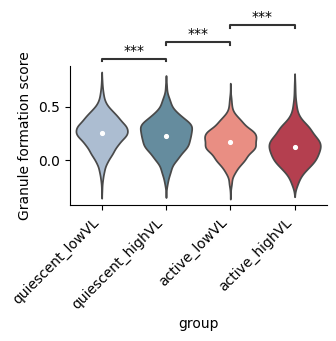

/tmp/ipykernel_22382/1074616450.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 0}` instead.

  sns.pointplot(
/home/users/isakova/.local/lib/python3.12/site-packages/statannotations/Annotator.py:825: UserWar

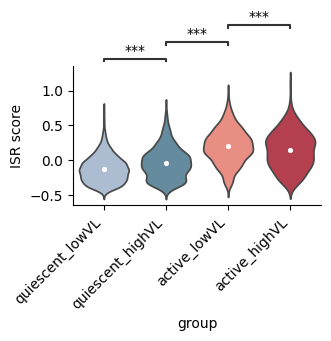

/tmp/ipykernel_22382/1074616450.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 0}` instead.

  sns.pointplot(
/home/users/isakova/.local/lib/python3.12/site-packages/statannotations/Annotator.py:825: UserWar

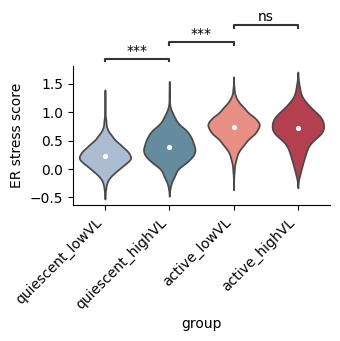

/tmp/ipykernel_22382/1074616450.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 0}` instead.

  sns.pointplot(
/home/users/isakova/.local/lib/python3.12/site-packages/statannotations/Annotator.py:825: UserWar

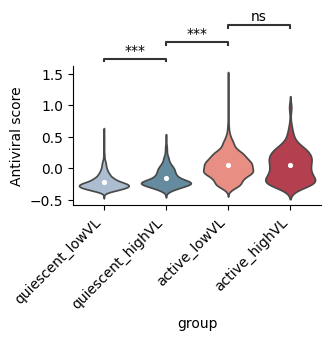

/tmp/ipykernel_22382/1074616450.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 0}` instead.

  sns.pointplot(
/home/users/isakova/.local/lib/python3.12/site-packages/statannotations/Annotator.py:825: UserWar

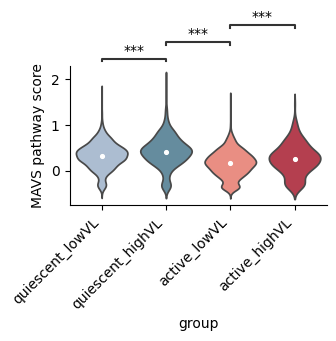

/tmp/ipykernel_22382/1074616450.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 0}` instead.

  sns.pointplot(
/home/users/isakova/.local/lib/python3.12/site-packages/statannotations/Annotator.py:825: UserWar

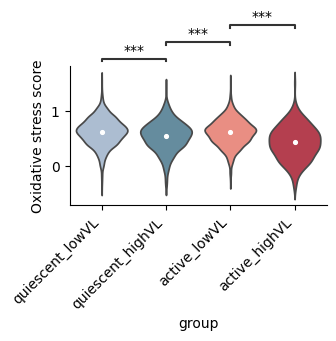

/tmp/ipykernel_22382/1074616450.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 0}` instead.

  sns.pointplot(
/home/users/isakova/.local/lib/python3.12/site-packages/statannotations/Annotator.py:825: UserWar

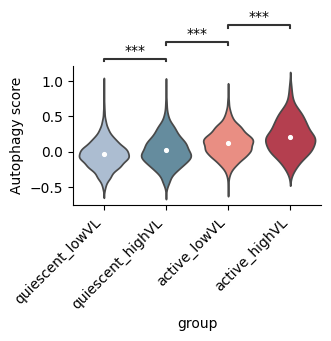

/tmp/ipykernel_22382/1074616450.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 0}` instead.

  sns.pointplot(
/home/users/isakova/.local/lib/python3.12/site-packages/statannotations/Annotator.py:825: UserWar

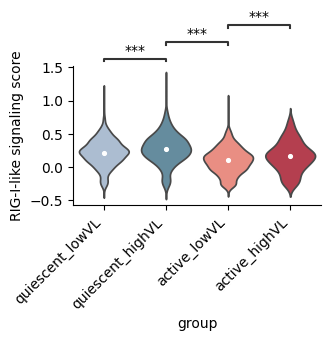

/tmp/ipykernel_22382/1074616450.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 0}` instead.

  sns.pointplot(
/home/users/isakova/.local/lib/python3.12/site-packages/statannotations/Annotator.py:825: UserWar

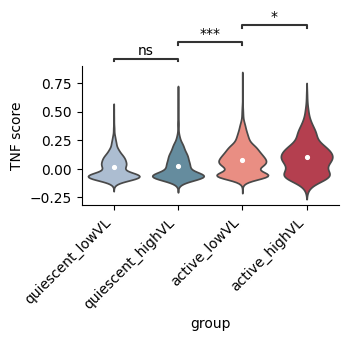

/tmp/ipykernel_22382/1074616450.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 0}` instead.

  sns.pointplot(
/home/users/isakova/.local/lib/python3.12/site-packages/statannotations/Annotator.py:825: UserWar

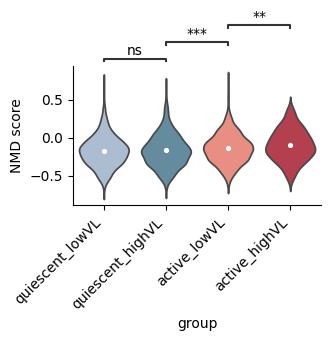

/tmp/ipykernel_22382/1074616450.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 0}` instead.

  sns.pointplot(
/home/users/isakova/.local/lib/python3.12/site-packages/statannotations/Annotator.py:825: UserWar

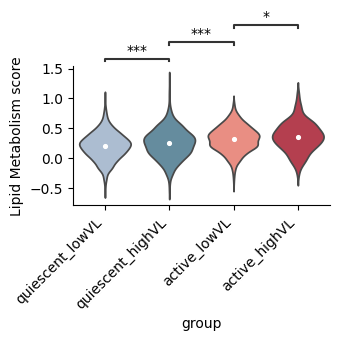

/tmp/ipykernel_22382/1074616450.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 0}` instead.

  sns.pointplot(
/home/users/isakova/.local/lib/python3.12/site-packages/statannotations/Annotator.py:825: UserWar

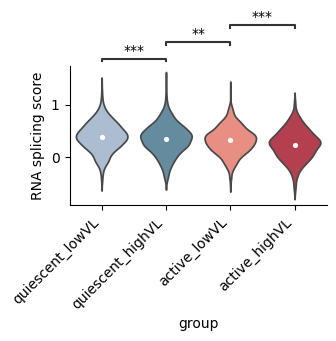

/tmp/ipykernel_22382/1074616450.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 0}` instead.

  sns.pointplot(
/home/users/isakova/.local/lib/python3.12/site-packages/statannotations/Annotator.py:825: UserWar

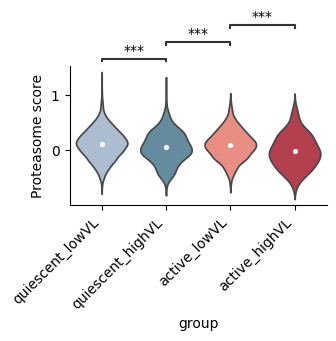

/tmp/ipykernel_22382/1074616450.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 0}` instead.

  sns.pointplot(
/home/users/isakova/.local/lib/python3.12/site-packages/statannotations/Annotator.py:825: UserWar

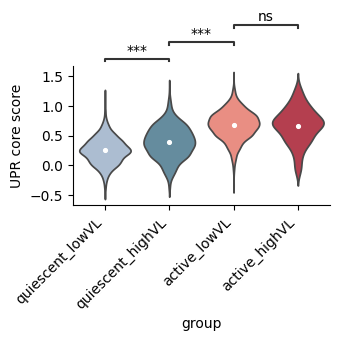

/tmp/ipykernel_22382/1074616450.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 0}` instead.

  sns.pointplot(
/home/users/isakova/.local/lib/python3.12/site-packages/statannotations/Annotator.py:825: UserWar

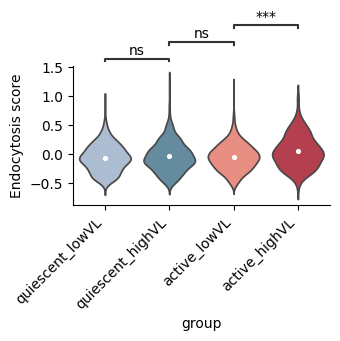

/tmp/ipykernel_22382/1074616450.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 0}` instead.

  sns.pointplot(
/home/users/isakova/.local/lib/python3.12/site-packages/statannotations/Annotator.py:825: UserWar

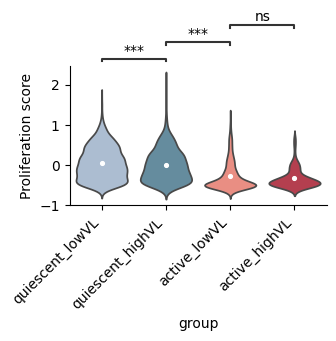

/tmp/ipykernel_22382/1074616450.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 0}` instead.

  sns.pointplot(
/home/users/isakova/.local/lib/python3.12/site-packages/statannotations/Annotator.py:825: UserWar

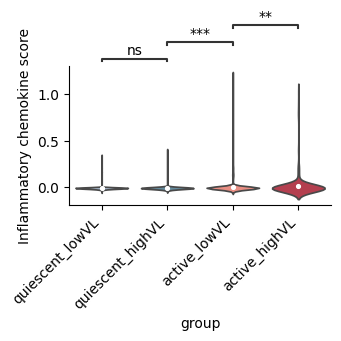

/tmp/ipykernel_22382/1074616450.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(
/tmp/ipykernel_22382/1074616450.py:80: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 0}` instead.

  sns.pointplot(
/home/users/isakova/.local/lib/python3.12/site-packages/statannotations/Annotator.py:825: UserWar

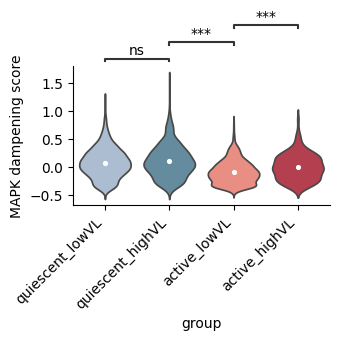

In [79]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from statannotations.Annotator import Annotator
from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests

# Define pathway score keys in .obs
pathway_scores = [
    "Granule_formation_score",
    "ISR_score",
    "ER_stress_score",
    "Antiviral_score",
    "MAVS_pathway_score",
    "Oxidative_stress_score",
    "Autophagy_score",
    "RIG-I-like_signaling_score",
    "TNF_score",
    "NMD_score",
    "Lipid_Metabolism_score",
    "RNA_splicing_score",
    "Proteasome_score",
    "UPR_core_score",
    "Endocytosis_score",
    "Proliferation_score",
    "Inflammatory_chemokine_score",
    "MAPK_dampening_score"
]

# Define pairwise comparisons
comparisons = [
    ("quiescent_lowVL", "quiescent_highVL"),
    ("quiescent_highVL", "active_lowVL"),
    ("active_lowVL", "active_highVL")
]

# Plot each score
for score_name in pathway_scores:
    if score_name not in adatad.obs.columns:
        print(f"Skipping {score_name}: not found in .obs")
        continue

    df = pd.DataFrame({
        "score": adatad.obs[score_name],
        "group": adatad.obs["group"]
    })

    # Compute raw p-values
    pvals = []
    for group1, group2 in comparisons:
        data1 = df[df["group"] == group1]["score"]
        data2 = df[df["group"] == group2]["score"]
        stat, pval = mannwhitneyu(data1, data2, alternative="two-sided")
        pvals.append(pval)

    # FDR correction
    reject, pvals_corrected, _, _ = multipletests(pvals, method='fdr_bh')

    # Format p-values
    #formatted_pvals = [f"p={p:.3g}" if p >= 0.001 else f"p<{p:.1g}" for p in pvals_corrected]
    formatted_pvals = [f"p={p:.3g}" if p >= 0.001 else "p<0.001" for p in pvals_corrected]


    # Plot
    plt.figure(figsize=(3.5, 4))
    ax = sns.violinplot(
        data=df,
        x="group",
        y="score",
        order=ordered_branches,
        palette=branch_palette,
        inner=None
    )
    #sns.boxplot(
    #   data=df, x="group", y="score", 
    #   width=0.2, showcaps=True, boxprops={'facecolor':'none', 'linewidth':1.2},
    #   whiskerprops={'linewidth':1.2}, flierprops={'marker':'o', 'markersize':3},
    #   medianprops={'linewidth':2}
    #)
    sns.pointplot(
        data=df,
        x="group",
        y="score",
        order=ordered_branches,
        color='white',
        join=False,
        markers='o',
        scale=0.5,
        errwidth=0
    )
    
    def p_to_star(p):
      if p < 0.001:
        return "***"
      elif p < 0.01:
        return "**"
      elif p < 0.05:
        return "*"
      else:
        return "ns"

    custom_stars = [p_to_star(p) for p in pvals_corrected]
    # Annotate with corrected p-values
    annotator = Annotator(ax, comparisons, data=df, x="group", y="score", order=ordered_branches)
    #annotator.set_custom_annotations(formatted_pvals)
    annotator.set_custom_annotations(custom_stars)
    annotator.configure(text_format='star', loc='outside', verbose=0)
    #annotator.configure(loc='outside', verbose=0)
    annotator.annotate()


    plt.xticks(rotation=45, ha='right')
    plt.ylabel(f"{score_name.replace('_', ' ')}")
    sns.despine(top=True, right=True)
    plt.tight_layout()
    plt.savefig(f"{score_name}_FDRcorrected_by_infection_branch.pdf", bbox_inches='tight')
    plt.show()


#### Pseudotime across groups

/tmp/ipykernel_11197/315460172.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


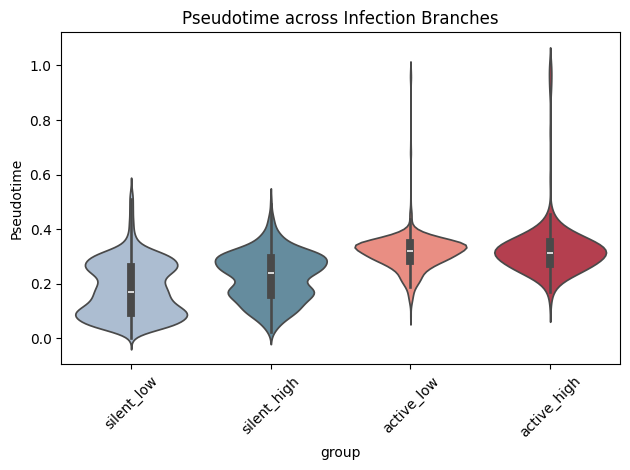

In [34]:
import seaborn as sns
import matplotlib.pyplot as plt

# Optional: ensure branch order
from pandas.api.types import CategoricalDtype

adatad.obs["group"] = adatad.obs["group"].astype(
    CategoricalDtype(categories=ordered_branches, ordered=True)
)

# Plot
sns.violinplot(
    data=adatad.obs,
    x="group",
    y="dpt_pseudotime",  # or the key you used for pseudotime
    inner="box",
    palette=branch_palette
)
plt.xticks(rotation=45)
plt.ylabel("Pseudotime")
plt.title("Pseudotime across Infection Branches")
plt.tight_layout()
plt.show()


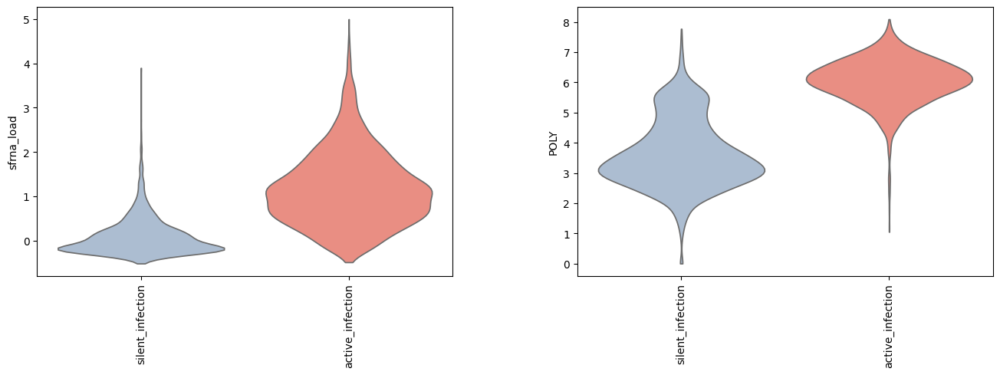

In [35]:
import scanpy as sc

# Violin plot for both sfrna_load and POLY per cluster
sc.pl.violin(
    adatad,
    keys=['sfrna_load', 'POLY'],
    groupby='cluster',           # replace with your cluster column if different
    stripplot=False,            # optional: hide individual dots
    jitter=False,               # optional: no jittering of dots
    rotation=90,                # rotates x-axis labels if needed
    multi_panel=True            # shows one panel per feature
)


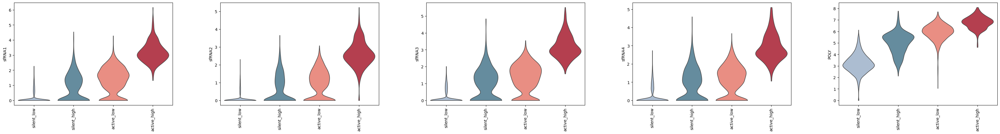

In [36]:
# Violin plot for both sfrna_load and POLY per cluster
sc.pl.violin(
    adatad,
    keys=['sfRNA1','sfRNA2','sfRNA3','sfRNA4', 'POLY'],
    groupby='group',           # replace with your cluster column if different
    stripplot=False,            # optional: hide individual dots
    jitter=False,               # optional: no jittering of dots
    rotation=90,                # rotates x-axis labels if needed
    multi_panel=True            # shows one panel per feature
)

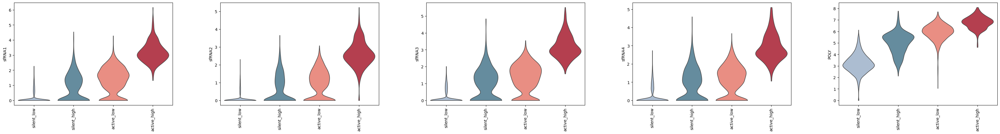

In [37]:
# Violin plot for both sfrna_load and POLY per cluster
sc.pl.violin(
    adatad,
    keys=['sfRNA1','sfRNA2','sfRNA3','sfRNA4', 'POLY'],
    groupby='group',           # replace with your cluster column if different
    stripplot=False,            # optional: hide individual dots
    jitter=False,               # optional: no jittering of dots
    rotation=90,                # rotates x-axis labels if needed
    multi_panel=True            # shows one panel per feature
)

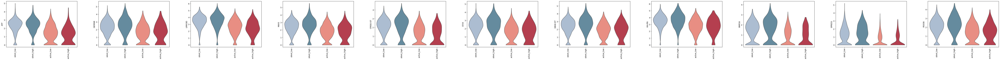

In [38]:
# Violin plot for both sfrna_load and POLY per cluster
sc.pl.violin(
    adatad,
    keys=['AFP','GEMIN8','LRRC8D','MAVS',"CPEB2-DT", "STX4", 'UBA6-DT','KALRN','MMP26','SPRED1','PDS5B'],
    groupby='group',           # replace with your cluster column if different
    stripplot=False,            # optional: hide individual dots
    jitter=False,               # optional: no jittering of dots
    rotation=90,                # rotates x-axis labels if needed
    multi_panel=True            # shows one panel per feature
)

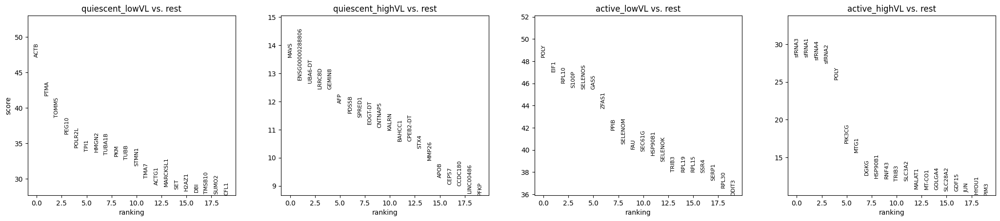

In [80]:
sc.tl.rank_genes_groups(adatad, groupby='group', method='wilcoxon')
sc.pl.rank_genes_groups(adatad, n_genes=20, sharey=False)

/tmp/ipykernel_22382/1083795409.py:36: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


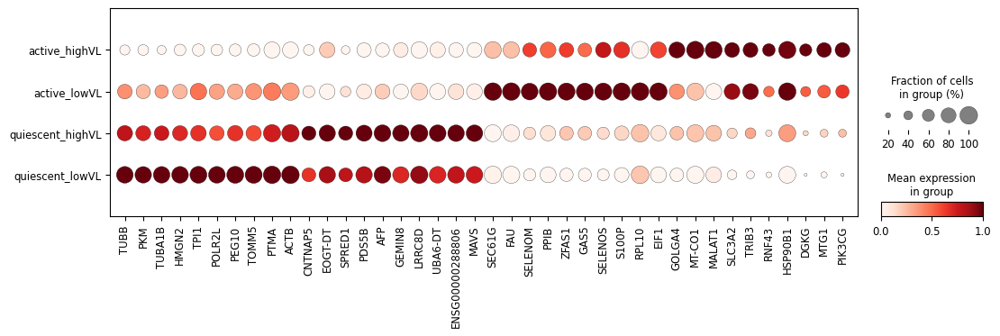

In [81]:
# Exclude viral genes
exclude_genes = {'POLY', 'sfRNA1', 'sfRNA2', 'sfRNA3', 'sfRNA4'}

# Extract top N DEGs per group
top_n = 10
grouped_genes = []

# Reverse group order directly in the categorical variable
adatad.obs['group'] = adatad.obs['group'].cat.reorder_categories(
    list(adatad.obs['group'].cat.categories)[::-1],
    ordered=True
)

for group in adatad.obs['group'].cat.categories:
    df = sc.get.rank_genes_groups_df(adatad, group=group)
    filtered = df[~df['names'].isin(exclude_genes)].head(top_n)
    grouped_genes.extend(filtered['names'].tolist())

# Remove duplicates and reverse gene order
genes_to_plot = list(dict.fromkeys(grouped_genes))[::-1]  # reverse Y-axis

# Reverse the group order (X-axis)
reversed_group_order = list(adatad.obs['group'].cat.categories)[::-1]

sc.pl.dotplot(
    adatad,
    var_names=genes_to_plot,
    groupby='group',
    standard_scale='var',
    cmap='Reds',
    dendrogram=False,
    figsize=(12.5, 3),
    show=False
)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.savefig("Dotplot_filtered_reversed_both.pdf", bbox_inches='tight')
plt.show()



/tmp/ipykernel_22382/4014081602.py:44: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  scatter = sns.scatterplot(


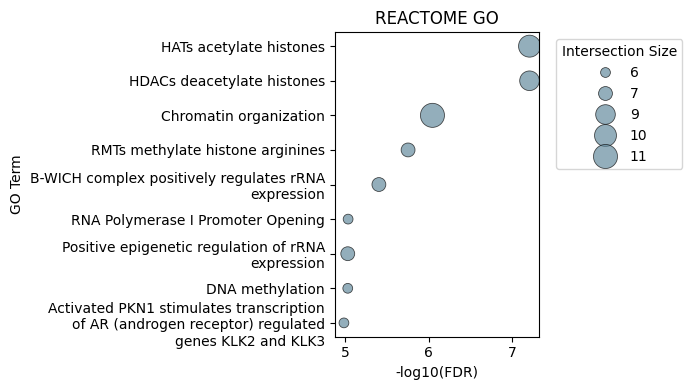

In [92]:
import scanpy as sc
from gprofiler import GProfiler

# Step 2: Choose a group to analyze DEGs for (e.g., 'active_high')
target_group = 'quiescent_highVL'
degs_df = sc.get.rank_genes_groups_df(adatad, group=target_group)

# Step 3: Filter DEGs - e.g., top 100 significant genes
degs_filtered = degs_df[degs_df['pvals_adj'] < 0.01].sort_values('logfoldchanges', ascending=False).head(100)

# Step 4: Prepare the gene list for g:Profiler
gene_list = degs_filtered['names'].tolist()

# Step 5: Run g:Profiler
gp = GProfiler(return_dataframe=True)
gprof_res = gp.profile(
    organism='hsapiens',
    query=gene_list,
    sources=["REAC"],
    user_threshold=0.01,
    significance_threshold_method='fdr'
)

# Step 6: View top terms
gprof_res = gprof_res.sort_values('p_value').head(35)
gprof_res = gprof_res[~gprof_res['name'].str.contains("HCMV|modifying", case=False)]

gprof_res[['name', 'p_value', 'intersection_size', 'term_size']]
# Remove any REACTOME terms that contain "HCMV"

import textwrap
df = gprof_res.copy()

# Only take a few top rows (optional)
df = df.sort_values("p_value").head(9)

# Compute useful transforms
df['-log10(FDR)'] = -np.log10(df['p_value'] + 1e-10)
df['term_name'] = df['name'].apply(lambda x: textwrap.fill(x, width=40))
df['gene_ratio'] = df['intersection_size'] / df['effective_domain_size']


plt.figure(figsize=(7.2, 4))
scatter = sns.scatterplot(
    data=df,
    #x='gene_ratio',
    x='-log10(FDR)',
    y='term_name',
    color='#668C9E',
    size='intersection_size',
    #hue='-log10(FDR)',
    palette='viridis',
    sizes=(50, 300),
    edgecolor='black',
    alpha=0.7
)

plt.xlabel("-log10(FDR)")
plt.ylabel("GO Term")
plt.title(f"REACTOME GO")
plt.legend(title='Intersection Size', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig("HDAC_REAC.pdf", format='pdf', bbox_inches='tight')
plt.show()


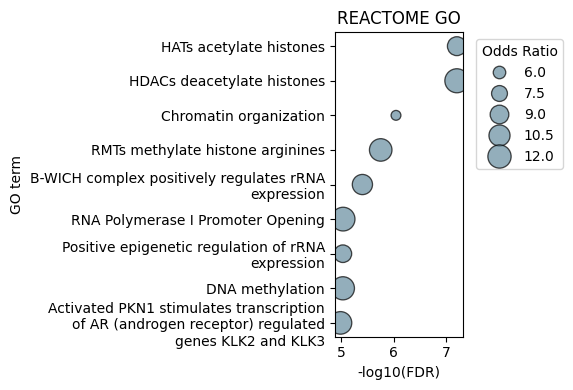

In [101]:
from scipy.stats import fisher_exact

query_size = len(gene_list)
background_size = int(df['effective_domain_size'].iloc[0])  # same for all terms in g:Profiler

odds_ratios = []
pvals = []

for idx, row in df.iterrows():
    a = row['intersection_size']                         # in gene_list & in term
    b = query_size - a                                   # in gene_list & not in term
    c = row['term_size'] - a                             # not in gene_list & in term
    d = background_size - a - b - c                      # not in gene_list & not in term

    # 2x2 table
    table = [[a, b], [c, d]]
    # Fisher's exact test
    oddsratio, pvalue = fisher_exact(table, alternative='greater')
    odds_ratios.append(oddsratio)
    pvals.append(pvalue)

df['odds_ratio'] = odds_ratios
df['fisher_pval'] = pvals
plt.figure(figsize=(6, 4))
sns.scatterplot(
    data=df,
    x='-log10(FDR)',
    y='term_name',
    size='odds_ratio',
    color='#668C9E',
    #hue='intersection_size',
    #palette='viridis',
    sizes=(50, 300),
    edgecolor='black',
    alpha=0.7,
    legend="brief"
)
plt.xlabel("-log10(FDR)")
plt.ylabel("GO term")
plt.title("REACTOME GO")
plt.legend(title='Odds Ratio', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig("HDAC_REACv2.pdf", format='pdf', bbox_inches='tight')
plt.show()


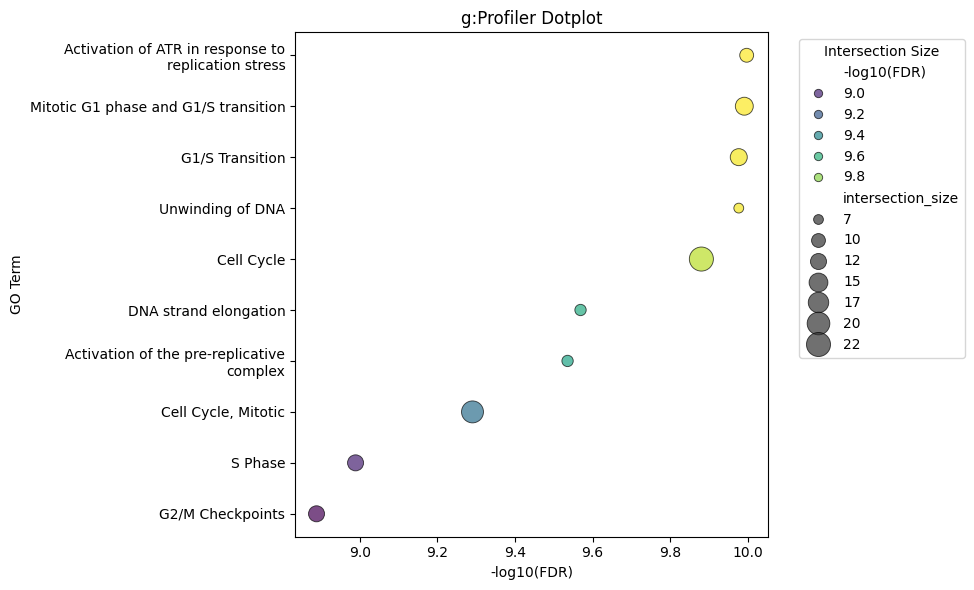

In [80]:
import scanpy as sc
from gprofiler import GProfiler

# Step 2: Choose a group to analyze DEGs for (e.g., 'active_high')
target_group = 'silent_low'
degs_df = sc.get.rank_genes_groups_df(adatad, group=target_group)

# Step 3: Filter DEGs - e.g., top 100 significant genes
degs_filtered = degs_df[degs_df['pvals_adj'] < 0.01].sort_values('logfoldchanges', ascending=False).head(100)

# Step 4: Prepare the gene list for g:Profiler
gene_list = degs_filtered['names'].tolist()

# Step 5: Run g:Profiler
gp = GProfiler(return_dataframe=True)
gprof_res = gp.profile(
    organism='hsapiens',
    query=gene_list,
    sources=["REAC"],
    user_threshold=0.01,
    significance_threshold_method='fdr'
)

# Step 6: View top terms
gprof_res = gprof_res.sort_values('p_value').head(15)
gprof_res[['name', 'p_value', 'intersection_size', 'term_size']]

import textwrap
df = gprof_res.copy()

# Only take a few top rows (optional)
df = df.sort_values("p_value").head(10)

# Compute useful transforms
df['-log10(FDR)'] = -np.log10(df['p_value'] + 1e-10)
df['term_name'] = df['name'].apply(lambda x: textwrap.fill(x, width=40))
df['gene_ratio'] = df['intersection_size'] / df['effective_domain_size']


plt.figure(figsize=(10, 6))
scatter = sns.scatterplot(
    data=df,
    x='-log10(FDR)',
    y='term_name',
    size='intersection_size',
    hue='-log10(FDR)',
    palette='viridis',
    sizes=(50, 300),
    edgecolor='black',
    alpha=0.7
)

plt.xlabel("-log10(FDR)")
plt.ylabel("GO Term")
plt.title(f"g:Profiler Dotplot")
plt.legend(title='Intersection Size', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


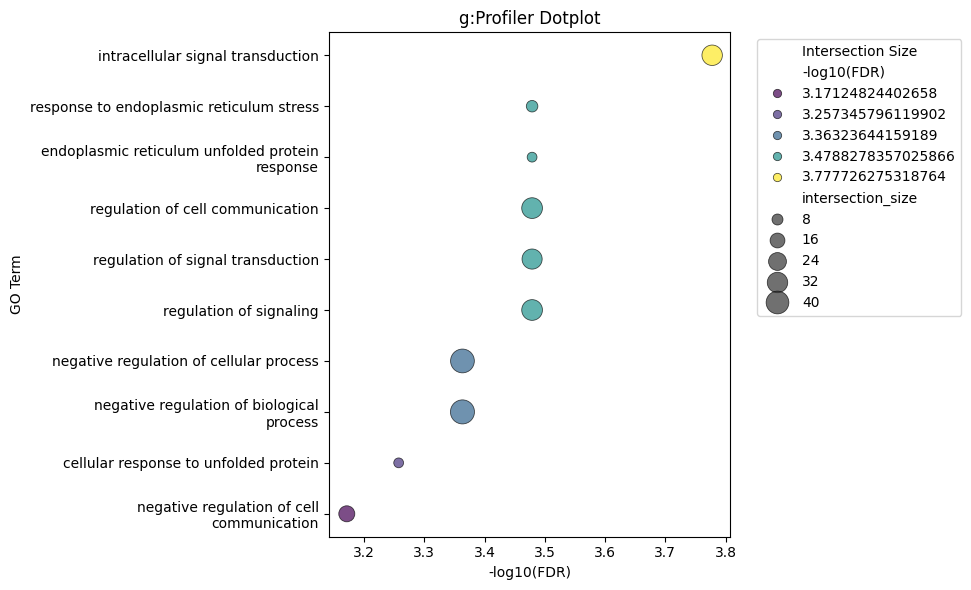

In [85]:
import scanpy as sc
from gprofiler import GProfiler

# Step 2: Choose a group to analyze DEGs for (e.g., 'active_high')
target_group = 'active_high'
degs_df = sc.get.rank_genes_groups_df(adatad, group=target_group)

# Step 3: Filter DEGs - e.g., top 100 significant genes
degs_filtered = degs_df[degs_df['pvals_adj'] < 0.05].sort_values('logfoldchanges', ascending=False).head(100)

# Step 4: Prepare the gene list for g:Profiler
gene_list = degs_filtered['names'].tolist()

# Step 5: Run g:Profiler
gp = GProfiler(return_dataframe=True)
gprof_res = gp.profile(
    organism='hsapiens',
    query=gene_list,
    sources=["GO:BP", "GO:MF","REAC"],
    user_threshold=0.01,
    significance_threshold_method='fdr'
)

# Step 6: View top terms
gprof_res = gprof_res.sort_values('p_value').head(15)
gprof_res[['name', 'p_value', 'intersection_size', 'term_size']]

import textwrap
df = gprof_res.copy()

# Only take a few top rows (optional)
df = df.sort_values("p_value").head(10)

# Compute useful transforms
df['-log10(FDR)'] = -np.log10(df['p_value'] + 1e-10)
df['term_name'] = df['name'].apply(lambda x: textwrap.fill(x, width=40))
df['gene_ratio'] = df['intersection_size'] / df['effective_domain_size']


plt.figure(figsize=(10, 6))
scatter = sns.scatterplot(
    data=df,
    x='-log10(FDR)',
    y='term_name',
    size='intersection_size',
    hue='-log10(FDR)',
    palette='viridis',
    sizes=(50, 300),
    edgecolor='black',
    alpha=0.7
)

plt.xlabel("-log10(FDR)")
plt.ylabel("GO Term")
plt.title(f"g:Profiler Dotplot")
plt.legend(title='Intersection Size', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


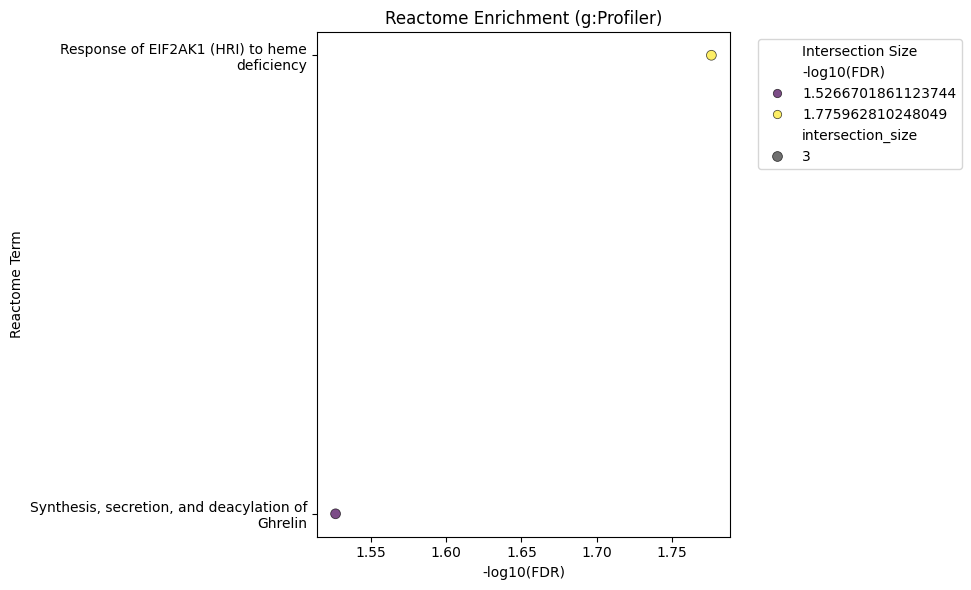

In [57]:
degs_df = sc.get.rank_genes_groups_df(adatad, group=target_group)

/tmp/ipykernel_11197/457879253.py:59: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.nsmallest(1, 'p_value'))


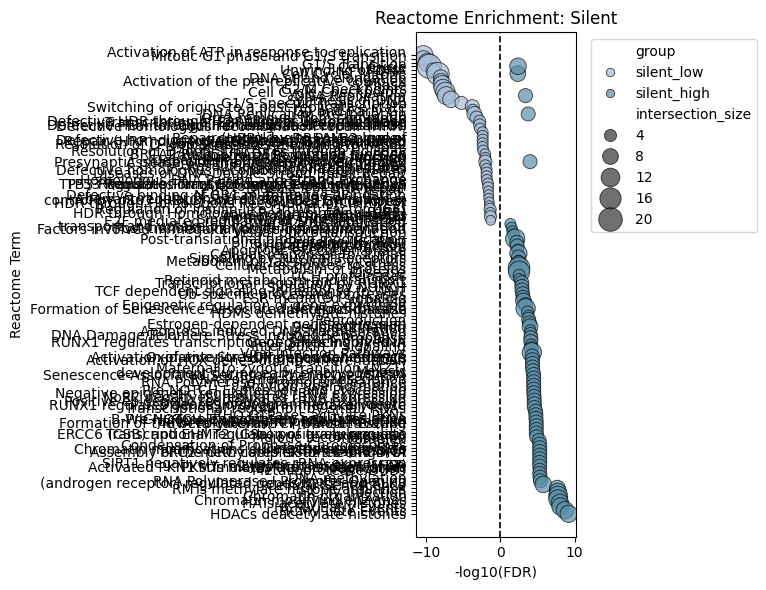

/tmp/ipykernel_11197/457879253.py:59: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.nsmallest(1, 'p_value'))


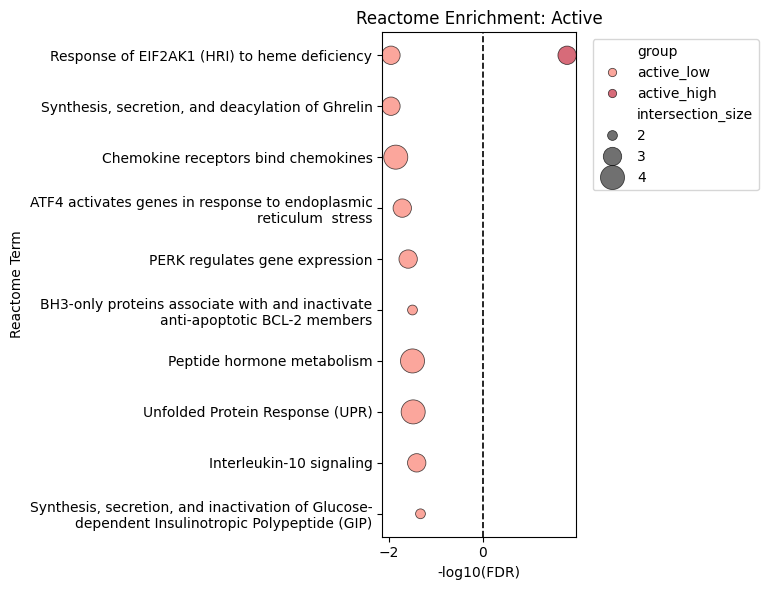

In [74]:
import scanpy as sc
import pandas as pd
import numpy as np
from gprofiler import GProfiler
import matplotlib.pyplot as plt
import seaborn as sns
import textwrap

# Parameters
gp = GProfiler(return_dataframe=True)
sources = ["REAC"]
top_n = 100
pval_thresh = 0.05

# Extract group names
groups = adatad.uns['rank_genes_groups']['names'].dtype.names
gprof_all = []

# Loop over each group
for group in groups:
    degs_df = sc.get.rank_genes_groups_df(adatad, group=group)
    degs_df = degs_df[degs_df['pvals_adj'] < pval_thresh].sort_values('logfoldchanges', ascending=False).head(top_n)
    gene_list = degs_df['names'].tolist()

    if len(gene_list) < 5:
        print(f"Skipping {group}: too few DEGs")
        continue

    gprof_res = gp.profile(
        organism='hsapiens',
        query=gene_list,
        sources=sources,
        user_threshold=pval_thresh,
        significance_threshold_method='fdr'
    )
    gprof_res['group'] = group
    gprof_all.append(gprof_res)

# Combine and process
gprof_df = pd.concat(gprof_all, ignore_index=True)

# Direction & -log10(FDR)
gprof_df['direction'] = gprof_df['group'].apply(lambda g: 'low' if 'low' in g else 'high')
gprof_df['log10p'] = -np.log10(gprof_df['p_value'].replace(0, 1e-300))
gprof_df.loc[gprof_df['direction'] == 'low', 'log10p'] *= -1
gprof_df['term_label'] = gprof_df['name'].apply(lambda x: textwrap.fill(x, width=50))

# Plotting function
def plot_gprof_dotplot(df, group_prefix, palette, filename):
    sub = df[df['group'].str.startswith(group_prefix)].copy()

    if sub.empty:
        print(f"No enrichment results for prefix '{group_prefix}'.")
        return

    # Top 10 terms per group
    top_terms = (
        sub.groupby(['group', 'term_label'], as_index=False)
           .apply(lambda g: g.nsmallest(1, 'p_value'))
           .reset_index(drop=True)
    )
    top_terms = top_terms.sort_values('log10p')

    # Plot
    plt.figure(figsize=(8, 6))
    ax = sns.scatterplot(
        data=top_terms,
        x='log10p',
        y='term_label',
        size='intersection_size',
        hue='group',
        palette=palette,
        sizes=(50, 300),
        edgecolor='black',
        alpha=0.7
    )
    plt.axvline(0, color='black', linestyle='--', linewidth=1.2)
    plt.xlabel("-log10(FDR)")
    plt.ylabel("Reactome Term")
    plt.title(f"Reactome Enrichment: {group_prefix.capitalize()}")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.savefig(filename, bbox_inches='tight')
    plt.show()

# Example usage
plot_gprof_dotplot(
    gprof_df,
    group_prefix='silent',
    palette={'silent_low': '#A6BDD7', 'silent_high': '#5B8FA8'},
    filename='silent_reactome_dotplot.pdf'
)

plot_gprof_dotplot(
    gprof_df,
    group_prefix='active',
    palette={'active_low': 'salmon', 'active_high': '#C72C41'},
    filename='active_reactome_dotplot.pdf'
)


/tmp/ipykernel_11197/1211855995.py:50: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  gprof_df = pd.concat(gprof_all, ignore_index=True)
/tmp/ipykernel_11197/1211855995.py:67: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.nsmallest(1, 'p_value'))


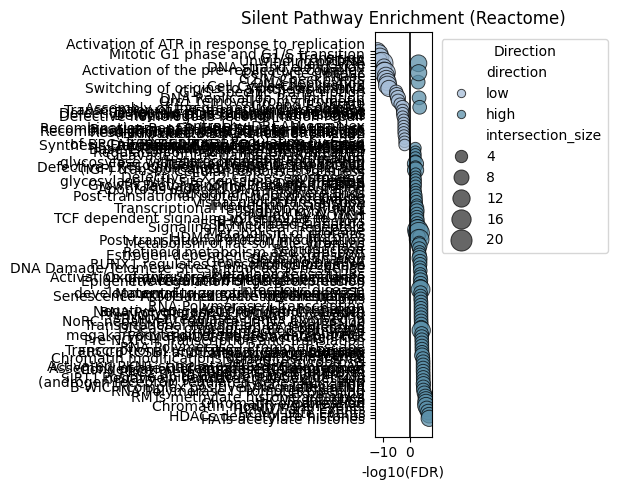

No terms to plot for active


In [75]:
import scanpy as sc
import pandas as pd
import numpy as np
from gprofiler import GProfiler
import seaborn as sns
import matplotlib.pyplot as plt
import textwrap

# Parameters
sources = ["REAC"]
top_n = 100
pval_thresh = 0.01
min_genes_required = 5

# Initialize
gp = GProfiler(return_dataframe=True)
groups = adatad.uns['rank_genes_groups']['names'].dtype.names
gprof_all = []
skipped_groups = []

# Loop through groups
for group in groups:
    df = sc.get.rank_genes_groups_df(adatad, group=group)
    df = df[df['pvals_adj'] < pval_thresh].sort_values('logfoldchanges', ascending=False).head(top_n)
    gene_list = df['names'].tolist()

    if len(gene_list) < min_genes_required:
        print(f"Skipping {group} (only {len(gene_list)} DEGs)")
        skipped_groups.append(group)
        continue

    try:
        gprof_res = gp.profile(
            organism='hsapiens',
            query=gene_list,
            sources=sources,
            user_threshold=pval_thresh,
            significance_threshold_method='fdr'
        )
        gprof_res['group'] = group
        gprof_all.append(gprof_res)
    except Exception as e:
        print(f"g:Profiler failed for {group}: {e}")
        skipped_groups.append(group)

# Combine results
if not gprof_all:
    raise ValueError("No enrichment results to plot.")

gprof_df = pd.concat(gprof_all, ignore_index=True)

# Process for plotting
gprof_df['direction'] = gprof_df['group'].apply(lambda g: 'low' if 'low' in g else 'high')
gprof_df['log10p'] = -np.log10(gprof_df['p_value'].replace(0, 1e-300))
gprof_df.loc[gprof_df['direction'] == 'low', 'log10p'] *= -1
gprof_df['term_label'] = gprof_df['name'].apply(lambda x: textwrap.fill(x, 45))

# Plotting function
def plot_gprof_dotplot(df, prefix, color_dict, filename):
    subset = df[df['group'].str.startswith(prefix)].copy()
    if subset.empty:
        print(f"No terms to plot for {prefix}")
        return

    top_terms = (
        subset.groupby(['term_label', 'direction'], as_index=False)
        .apply(lambda g: g.nsmallest(1, 'p_value'))
        .reset_index(drop=True)
    )

    top_terms = top_terms.sort_values('log10p')

    plt.figure(figsize=(6.5, 5))
    ax = sns.scatterplot(
        data=top_terms,
        x='log10p',
        y='term_label',
        size='intersection_size',
        hue='direction',
        palette=color_dict,
        sizes=(60, 250),
        edgecolor='black',
        alpha=0.75
    )

    ax.axvline(0, color='black', linewidth=1.2)
    plt.xlabel("-log10(FDR)")
    plt.ylabel("")
    plt.title(f"{prefix.capitalize()} Pathway Enrichment (Reactome)")
    plt.legend(title='Direction', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.savefig(filename, bbox_inches='tight')
    plt.show()

# Plot
plot_gprof_dotplot(gprof_df, 'silent', {'low': '#A6BDD7', 'high': '#5B8FA8'}, 'silent_reactome_dotplot.pdf')
plot_gprof_dotplot(gprof_df, 'active', {'low': 'salmon', 'high': '#C72C41'}, 'active_reactome_dotplot.pdf')


In [73]:
groups = adatad.uns['rank_genes_groups']['names'].dtype.names
groups

('silent_low', 'silent_high', 'active_low', 'active_high')